In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# Data Analysis Report

### Objective : Create predictive ML model for payroll information of employees of the state of Texas

Also find the factors that impact Salary of an employee of state.

In [2]:
data=pd.read_csv('salary.csv')
data

,AGENCY,AGENCY NAME,LAST NAME,FIRST NAME,MI,CLASS CODE,CLASS TITLE,ETHNICITY,GENDER,STATUS,...,HRLY RATE,HRS PER WK,MONTHLY,ANNUAL,STATE NUMBER,duplicated,multiple_full_time_jobs,combined_multiple_jobs,summed_annual_salary,hide_from_search
0,241,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...",RUCKER,MORTON,V,JD25,"JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,...,75.96150,29.0,9545.82,114549.84,127717,True,NaN,NaN,131407.08,NaN
1,212,OFFICE OF COURT ADMINISTRATION ...,RUCKER,MORTON,V,3524,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,...,81.04454,4.0,1404.77,16857.24,127717,True,NaN,NaN,NaN,True
2,241,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...",SPECIA JR,JOHN,J,JD25,"JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,...,75.96150,29.0,9545.82,114549.84,59115,True,NaN,NaN,131407.08,NaN
3,212,OFFICE OF COURT ADMINISTRATION ...,SPECIA JR,JOHN,J,3524,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,...,81.04453,4.0,1404.77,16857.24,59115,True,NaN,NaN,NaN,True
4,696,TEXAS DEPARTMENT OF CRIMINAL JUSTICE ...,ONTIVEROS,ESTHER,,4504,CORREC OFFICER IV ...,HISPANIC,FEMALE,CRF - CLASSIFIED REGULAR FULL-TIME,...,0.00000,40.0,3284.27,39411.24,165030,True,1.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149476,809,STATE PRESERVATION BOARD ...,WESSELS,JOHN,P,6232,SECURITY OFFICER III ...,WHITE,MALE,CRF - CLASSIFIED REGULAR FULL-TIME,...,0.00000,40.0,2899.00,34788.00,770781,NaN,NaN,NaN,NaN,NaN
149477,809,STATE PRESERVATION BOARD ...,WINDHAM,EVAN,A,0302,WEB ADMINISTRATOR III ...,WHITE,FEMALE,CRF - CLASSIFIED REGULAR FULL-TIME,...,0.00000,40.0,5500.00,66000.00,847431,NaN,NaN,NaN,NaN,NaN
149478,809,STATE PRESERVATION BOARD ...,WRIGHT,DERRICK,C,0130,CUSTOMER SERVICE REP I ...,WHITE,MALE,CRP - CLASSIFIED REGULAR PART-TIME,...,12.93000,20.0,1120.60,13447.20,34266,NaN,NaN,NaN,NaN,NaN
149479,809,STATE PRESERVATION BOARD ...,YOUNG,DOUGLAS,R,1572,PROGRAM SPECIALIST III ...,WHITE,MALE,CRF - CLASSIFIED REGULAR FULL-TIME,...,0.00000,40.0,5744.16,68929.92,123490,NaN,NaN,NaN,NaN,NaN


In [3]:
data.columns

Index(['AGENCY', 'AGENCY NAME', 'LAST NAME', 'FIRST NAME', 'MI', 'CLASS CODE',
       'CLASS TITLE', 'ETHNICITY', 'GENDER', 'STATUS', 'EMPLOY DATE',
       'HRLY RATE', 'HRS PER WK', 'MONTHLY', 'ANNUAL', 'STATE NUMBER',
       'duplicated', 'multiple_full_time_jobs', 'combined_multiple_jobs',
       'summed_annual_salary', 'hide_from_search'],
      dtype='object')

#### Selection of important data from the datasets for ML model.
'duplicated', 'multiple_full_time_jobs', 'combined_multiple_jobs','summed_annual_salary', 'hide_from_search'
##### these column are less important and has many null values which affect models predictability and called garbage data. 

In [4]:
df=data[['AGENCY','AGENCY NAME','CLASS CODE','CLASS TITLE', 'ETHNICITY', 'GENDER', 'STATUS','EMPLOY DATE',
       'HRLY RATE', 'HRS PER WK', 'MONTHLY', 'ANNUAL','STATE NUMBER']]
df.head()

,AGENCY,AGENCY NAME,CLASS CODE,CLASS TITLE,ETHNICITY,GENDER,STATUS,EMPLOY DATE,HRLY RATE,HRS PER WK,MONTHLY,ANNUAL,STATE NUMBER
0,241,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...",JD25,"JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,02/18/88,75.96150,29.0,9545.82,114549.84,127717
1,212,OFFICE OF COURT ADMINISTRATION ...,3524,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,02/01/15,81.04454,4.0,1404.77,16857.24,127717
2,241,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...",JD25,"JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,02/01/20,75.96150,29.0,9545.82,114549.84,59115
3,212,OFFICE OF COURT ADMINISTRATION ...,3524,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,09/01/18,81.04453,4.0,1404.77,16857.24,59115
4,696,TEXAS DEPARTMENT OF CRIMINAL JUSTICE ...,4504,CORREC OFFICER IV ...,HISPANIC,FEMALE,CRF - CLASSIFIED REGULAR FULL-TIME,06/29/20,0.00000,40.0,3284.27,39411.24,165030


# Domain Analysis
### Categorical Columns:
1. Agency and agency name are correlated, where agency is used to call agency name.
2. similarly there are class title and class code.
3. 'ETHNICITY', 'GENDER', 'STATUS' has a direct impact on the predictive model.

### Date Columns: 
EMPLOY DATE needs to change date format, current format is mm/dd/yy.
### Numerical Columns:
1. 'HRLY RATE': annual salary / total working hours in a year
2. HRS PER WK: Total working hours/ weekdays
3. 'MONTHLY' and 'ANNUAL' are montly salary and annual salary
4. duplicated: a person performs two roles.

In [5]:
df.describe()

,AGENCY,HRLY RATE,HRS PER WK,MONTHLY,ANNUAL,STATE NUMBER
count,149481.000000,149481.000000,149481.000000,149481.000000,149481.000000,1.494810e+05
mean,545.736288,0.346488,39.714918,4226.184248,50714.210973,5.651930e+05
std,139.057691,4.211485,2.323855,2093.111691,25117.340292,4.786212e+05
min,101.000000,0.000000,1.000000,50.000000,600.000000,1.000000e+00
25%,529.000000,0.000000,40.000000,3019.840000,36238.080000,1.133340e+05
50%,530.000000,0.000000,40.000000,3720.170000,44642.040000,3.463730e+05
75%,696.000000,0.000000,40.000000,4865.810000,58389.720000,1.100500e+06
max,930.000000,117.788480,70.000000,46125.000000,553500.000000,1.271604e+06


In [6]:
df.describe(include='O')

,AGENCY NAME,CLASS CODE,CLASS TITLE,ETHNICITY,GENDER,STATUS,EMPLOY DATE
count,149481,149481,149481,149481,149481,149481,149481
unique,113,1481,1422,6,2,11,6295
top,HEALTH AND HUMAN SERVICES COMMISSION ...,4504,CORREC OFFICER IV ...,WHITE,FEMALE,CRF - CLASSIFIED REGULAR FULL-TIME,09/01/17
freq,36667,9267,9267,67142,85328,142502,12359


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149481 entries, 0 to 149480
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   AGENCY        149481 non-null  int64  
 1   AGENCY NAME   149481 non-null  object 
 2   CLASS CODE    149481 non-null  object 
 3   CLASS TITLE   149481 non-null  object 
 4   ETHNICITY     149481 non-null  object 
 5   GENDER        149481 non-null  object 
 6   STATUS        149481 non-null  object 
 7   EMPLOY DATE   149481 non-null  object 
 8   HRLY RATE     149481 non-null  float64
 9   HRS PER WK    149481 non-null  float64
 10  MONTHLY       149481 non-null  float64
 11  ANNUAL        149481 non-null  float64
 12  STATE NUMBER  149481 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 14.8+ MB


In [8]:
# Replace space with underscore in all column names
df.columns = df.columns.str.replace(' ', '_')

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149481 entries, 0 to 149480
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   AGENCY        149481 non-null  int64  
 1   AGENCY_NAME   149481 non-null  object 
 2   CLASS_CODE    149481 non-null  object 
 3   CLASS_TITLE   149481 non-null  object 
 4   ETHNICITY     149481 non-null  object 
 5   GENDER        149481 non-null  object 
 6   STATUS        149481 non-null  object 
 7   EMPLOY_DATE   149481 non-null  object 
 8   HRLY_RATE     149481 non-null  float64
 9   HRS_PER_WK    149481 non-null  float64
 10  MONTHLY       149481 non-null  float64
 11  ANNUAL        149481 non-null  float64
 12  STATE_NUMBER  149481 non-null  int64  
dtypes: float64(4), int64(2), object(7)
memory usage: 14.8+ MB


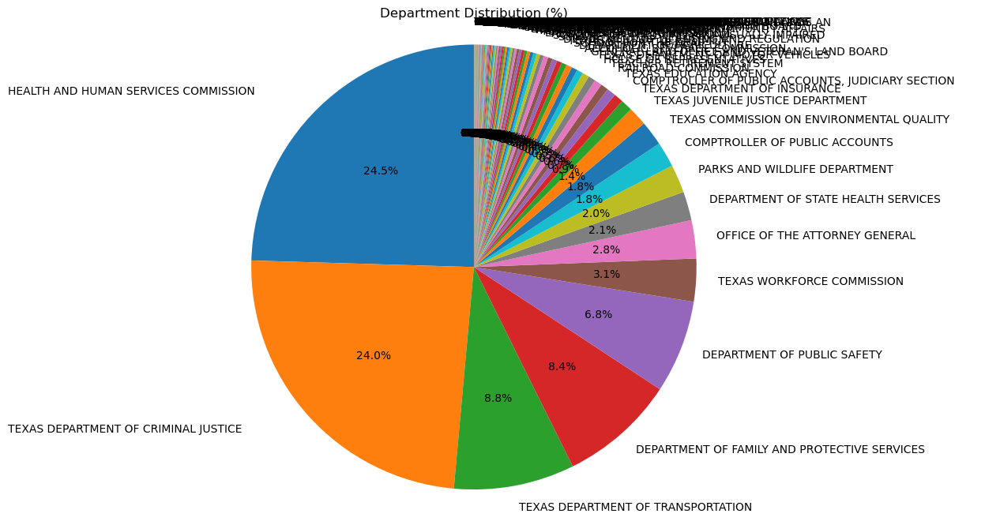

In [10]:
# Extract columns
df['AGENCY_NAME'].value_counts(normalize=True)*100
data=df['AGENCY_NAME'].value_counts()

plt.figure(figsize=(8,8))
plt.pie(data, labels=data.index, autopct='%1.1f%%', startangle=90)
plt.title('Department Distribution (%)')
plt.axis('equal')   # Equal aspect ratio ensures pie is drawn as a circle
plt.show()

More than 70% data is consist of 5 department : HEALTH , Ciminal Justice , Transport, FAMILY ,PUBLIC SAFETY


In [11]:
df['ETHNICITY'].value_counts()

ETHNICITY
WHITE              67142
HISPANIC           40585
BLACK              35853
ASIAN               4268
OTHER                921
AM INDIAN            712
Name: count, dtype: int64

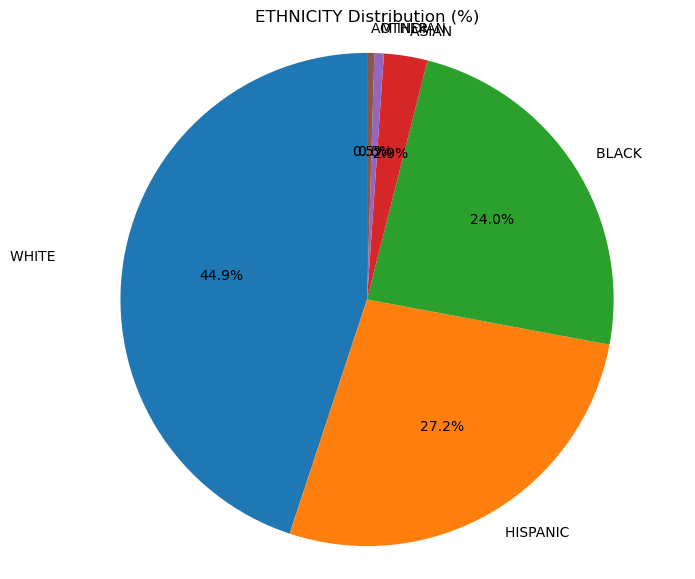

In [12]:
# Extract columns
df['ETHNICITY'].value_counts(normalize=True)*100
data=df['ETHNICITY'].value_counts()

plt.figure(figsize=(7,7))
plt.pie(data, labels=data.index, autopct='%1.1f%%', startangle=90)
plt.title('ETHNICITY Distribution (%)')
plt.axis('equal')   # Equal aspect ratio ensures pie is drawn as a circle
plt.show()

In [13]:
# data is very imbalance thus chnage in the features needs to be done thus small categorise were categorise in one column

mapping = {
    'AM INDIAN':'OTHER',
    'ASIAN':'OTHER'
}

df['ETHNICITY'] = df['ETHNICITY'].str.strip()         # remove any extra spaces
df['ETHNICITY'] = df['ETHNICITY'].replace(mapping)   # rename values


In [4]:
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
import numpy as np

class EthnicityTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, mapping=None, column='ETHNICITY'):
        """
        Custom transformer for ethnicity column preprocessing
        
        Parameters:
        mapping (dict): Dictionary mapping original values to new values
        column (str): Name of the column to transform
        """
        self.mapping = mapping or {
            'AM INDIAN': 'OTHER',
            'ASIAN': 'OTHER'
        }
        self.column = column
    
    def fit(self, X, y=None):
        # Store original values for reference
        if self.column in X.columns:
            self.original_categories_ = X[self.column].unique()
        return self
    
    def transform(self, X):
        """
        Apply ethnicity preprocessing with error handling
        """
        try:
            X_copy = X.copy()
            
            if self.column in X_copy.columns:
                # Remove extra spaces
                X_copy[self.column] = X_copy[self.column].str.strip()
                
                # Apply mapping
                X_copy[self.column] = X_copy[self.column].replace(self.mapping)
            
            return X_copy
            
        except Exception as e:
            print(f"Error in EthnicityTransformer: {e}")
            raise

In [2]:
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# Create test data
test_data = pd.DataFrame({
    'ETHNICITY': ['AM INDIAN', 'ASIAN', 'WHITE', 'BLACK', ' AM INDIAN ', 'ASIAN', 'HISPANIC'],
    'AGE': [25, 30, 35, 40, 45, 50, 55],
    'SALARY': [50000, 60000, 70000, 80000, 90000, 100000, 110000]
})

print("BEFORE TRANSFORMATION:")
print(test_data['ETHNICITY'].value_counts())
print("\nSample data:")
print(test_data.head())

BEFORE TRANSFORMATION:
ETHNICITY
ASIAN          2
AM INDIAN      1
WHITE          1
BLACK          1
 AM INDIAN     1
HISPANIC       1
Name: count, dtype: int64

Sample data:
     ETHNICITY  AGE  SALARY
0    AM INDIAN   25   50000
1        ASIAN   30   60000
2        WHITE   35   70000
3        BLACK   40   80000
4   AM INDIAN    45   90000


In [5]:
# Test the transformer
transformer = EthnicityTransformer()

# Apply transformation
transformed_data = transformer.fit_transform(test_data)

print("\nAFTER TRANSFORMATION:")
print(transformed_data['ETHNICITY'].value_counts())
print("\nSample transformed data:")
print(transformed_data.head())


AFTER TRANSFORMATION:
ETHNICITY
OTHER       4
WHITE       1
BLACK       1
HISPANIC    1
Name: count, dtype: int64

Sample transformed data:
  ETHNICITY  AGE  SALARY
0     OTHER   25   50000
1     OTHER   30   60000
2     WHITE   35   70000
3     BLACK   40   80000
4     OTHER   45   90000


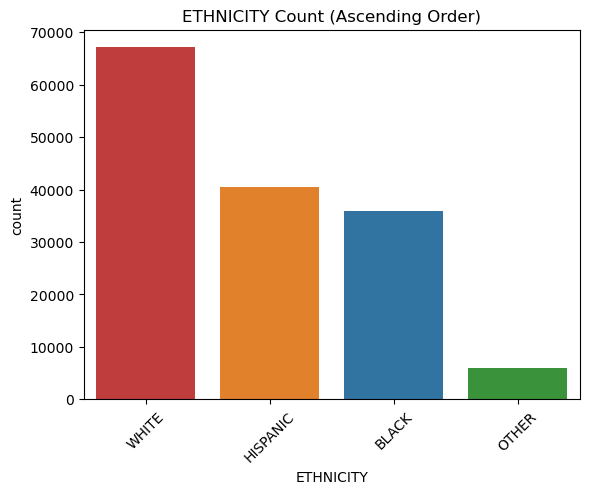

In [14]:
order = df['ETHNICITY'].value_counts().index

sns.countplot(x='ETHNICITY', data=df, hue='ETHNICITY', order=order)
plt.xticks(rotation=45)   # optional: rotate x labels for readability
plt.title('ETHNICITY Count (Ascending Order)')
plt.show()

data is imbalanced but can be managable,
1. where needs to categorise all Asian, others and Indian into other category
2. encoding : Target encoding: Replace category with the mean of target variable for that category.

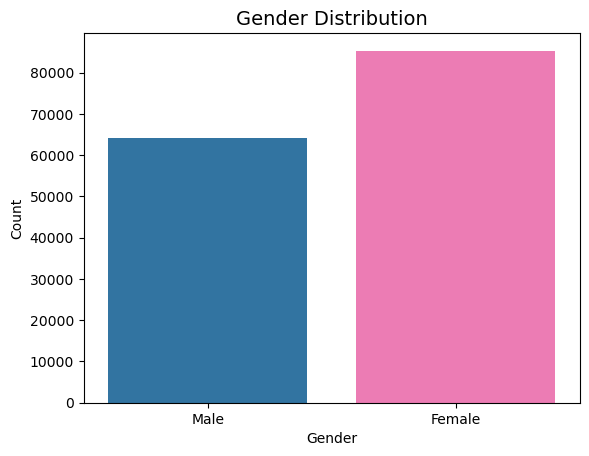

In [15]:
# 🎨 Define custom colors
df['GENDER'] = df['GENDER'].str.strip().str.title()

# 🎨 Define custom colors
gender_colors = {'Male': '#1f77b4',  # blue
                 'Female': '#ff69b4'}  # pink

# 📊 Plot
sns.countplot(x='GENDER', data=df, hue='GENDER', palette=gender_colors)
plt.title("Gender Distribution", fontsize=14)
plt.xlabel("Gender")
plt.ylabel("Count")
plt.show()

In [16]:
df['STATUS'].value_counts()

STATUS
CRF - CLASSIFIED REGULAR FULL-TIME          142502
URF - UNCLASSIFIED REGULAR FULL-TIME          2363
CRP - CLASSIFIED REGULAR PART-TIME            1531
CTF - CLASSIFIED TEMPORARY FULL-TIME          1096
URP - UNCLASSIFIED REGULAR PART-TIME           950
ERF - EXEMPT REGULAR FULL-TIME                 923
CTP - CLASSIFIED TEMPORARY PART-TIME            81
UTP - UNCLASSIFIED TEMPORARY PART-TIME          21
UTF - UNCLASSIFIED TEMPORARY FULL-TIME          12
CTP - CLASSIFIED TEMPORARY FULL-TIME             1
ERP - EXEMPT REGULAR PART-TIME                   1
Name: count, dtype: int64

In [17]:
df.STATUS

0         URP - UNCLASSIFIED REGULAR PART-TIME    
1         CTP - CLASSIFIED TEMPORARY PART-TIME    
2         URP - UNCLASSIFIED REGULAR PART-TIME    
3         CTP - CLASSIFIED TEMPORARY PART-TIME    
4         CRF - CLASSIFIED REGULAR FULL-TIME      
                            ...                   
149476    CRF - CLASSIFIED REGULAR FULL-TIME      
149477    CRF - CLASSIFIED REGULAR FULL-TIME      
149478    CRP - CLASSIFIED REGULAR PART-TIME      
149479    CRF - CLASSIFIED REGULAR FULL-TIME      
149480    CRP - CLASSIFIED REGULAR PART-TIME      
Name: STATUS, Length: 149481, dtype: object

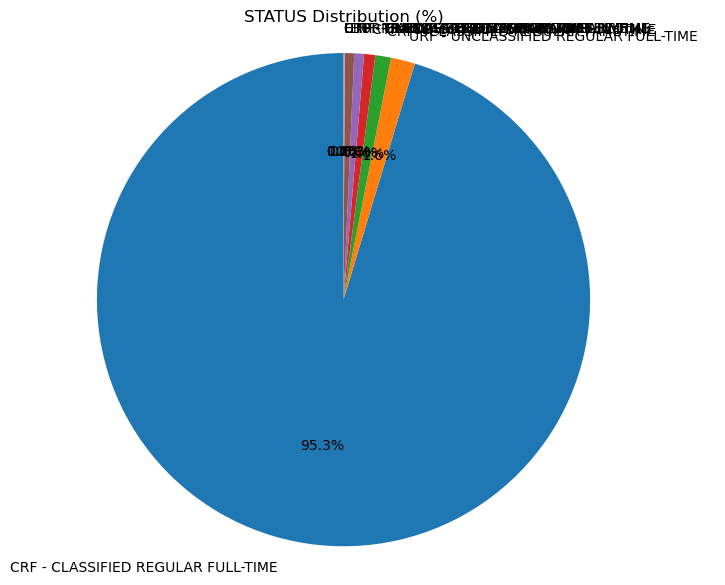

In [18]:
# Extract columns
df['STATUS'].value_counts(normalize=True)*100
data=df['STATUS'].value_counts()

plt.figure(figsize=(7,7))
plt.pie(data, labels=data.index, autopct='%1.1f%%', startangle=90)
plt.title('STATUS Distribution (%)')
plt.axis('equal')   # Equal aspect ratio ensures pie is drawn as a circle
plt.show()

Change this column into a part-time and full-time segment, which helps in prediction and is easy to visualize


In [19]:
#use this because huge imbalance in the data, thus change this on the basis of Part time and Full time.

mapping = {
    'CRF - CLASSIFIED REGULAR FULL-TIME':'FULL-TIME',
    'URF - UNCLASSIFIED REGULAR FULL-TIME':'FULL-TIME',
    'CRP - CLASSIFIED REGULAR PART-TIME':'PART-TIME',
    'CTF - CLASSIFIED TEMPORARY FULL-TIME':'FULL-TIME',
    'URP - UNCLASSIFIED REGULAR PART-TIME':'PART-TIME',
    'ERF - EXEMPT REGULAR FULL-TIME':'FULL-TIME',
    'CTP - CLASSIFIED TEMPORARY PART-TIME':'PART-TIME',
    'UTP - UNCLASSIFIED TEMPORARY PART-TIME':'PART-TIME',
    'UTF - UNCLASSIFIED TEMPORARY FULL-TIME':'FULL-TIME',
    'CTP - CLASSIFIED TEMPORARY FULL-TIME':'FULL-TIME',
    'ERP - EXEMPT REGULAR PART-TIME':'PART-TIME'
}

df['STATUS'] = df['STATUS'].str.strip()         # remove any extra spaces
df['STATUS'] = df['STATUS'].replace(mapping)   # rename values
df['STATUS'] = df['STATUS'].astype('category') # convert back to category if needed


In [6]:
from sklearn.base import BaseEstimator, TransformerMixin
import pandas as pd
import numpy as np

class StatusTransformer(BaseEstimator, TransformerMixin):
    def __init__(self, mapping=None):
        """
        Custom transformer for STATUS column preprocessing
        
        Parameters:
        mapping (dict): Dictionary mapping original values to new values
        """
        self.mapping = mapping or {
            'CRF - CLASSIFIED REGULAR FULL-TIME': 'FULL-TIME',
            'URF - UNCLASSIFIED REGULAR FULL-TIME': 'FULL-TIME',
            'CRP - CLASSIFIED REGULAR PART-TIME': 'PART-TIME',
            'CTF - CLASSIFIED TEMPORARY FULL-TIME': 'FULL-TIME',
            'URP - UNCLASSIFIED REGULAR PART-TIME': 'PART-TIME',
            'ERF - EXEMPT REGULAR FULL-TIME': 'FULL-TIME',
            'CTP - CLASSIFIED TEMPORARY PART-TIME': 'PART-TIME',
            'UTP - UNCLASSIFIED TEMPORARY PART-TIME': 'PART-TIME',
            'UTF - UNCLASSIFIED TEMPORARY FULL-TIME': 'FULL-TIME',
            'CTP - CLASSIFIED TEMPORARY FULL-TIME': 'FULL-TIME',
            'ERP - EXEMPT REGULAR PART-TIME': 'PART-TIME',
            # Add common variations
            'FULL TIME': 'FULL-TIME',
            'FULLTIME': 'FULL-TIME',
            'FULL-TIME': 'FULL-TIME',
            'PART TIME': 'PART-TIME',
            'PARTTIME': 'PART-TIME',
            'PART-TIME': 'PART-TIME'
        }
    
    def fit(self, X, y=None):
        # Store original values for reference
        if 'STATUS' in X.columns:
            self.original_categories_ = X['STATUS'].unique()
            self.fitted_ = True
            
            # Auto-detect and add common variations found in data
            self._auto_detect_variations(X)
        else:
            self.fitted_ = False
        return self
    
    def _auto_detect_variations(self, X):
        """Auto-detect common variations of FULL-TIME and PART-TIME in the data"""
        status_values = X['STATUS'].str.strip().unique()
        
        for value in status_values:
            value_upper = value.upper()
            
            # Detect FULL-TIME variations
            if any(keyword in value_upper for keyword in ['FULL', 'FT']):
                if value not in self.mapping:
                    self.mapping[value] = 'FULL-TIME'
                    print(f"🔍 Auto-detected FULL-TIME variation: '{value}' -> 'FULL-TIME'")
            
            # Detect PART-TIME variations
            elif any(keyword in value_upper for keyword in ['PART', 'PT']):
                if value not in self.mapping:
                    self.mapping[value] = 'PART-TIME'
                    print(f"🔍 Auto-detected PART-TIME variation: '{value}' -> 'PART-TIME'")
    
    def _standardize_simple_forms(self, X_copy):
        """Handle simple forms like 'part-time', 'Part Time', 'FULLTIME', etc."""
        # Convert to uppercase for consistent matching
        status_upper = X_copy['STATUS'].str.upper()
        
        # Create masks for different patterns
        full_time_mask = (
            status_upper.str.contains('FULL', na=False) | 
            status_upper.str.contains('FT', na=False) |
            status_upper.isin(['FULLTIME', 'FULL TIME', 'FULL-TIME'])
        )
        
        part_time_mask = (
            status_upper.str.contains('PART', na=False) | 
            status_upper.str.contains('PT', na=False) |
            status_upper.isin(['PARTTIME', 'PART TIME', 'PART-TIME'])
        )
        
        # Apply standardization
        X_copy.loc[full_time_mask, 'STATUS'] = 'FULL-TIME'
        X_copy.loc[part_time_mask, 'STATUS'] = 'PART-TIME'
        
        return X_copy
    
    def transform(self, X):
        """
        Apply STATUS preprocessing with error handling
        """
        try:
            X_copy = X.copy()
            
            if 'STATUS' in X_copy.columns:
                # Remove extra spaces and convert to string
                X_copy['STATUS'] = X_copy['STATUS'].astype(str).str.strip()
                
                # First apply the predefined mapping
                X_copy['STATUS'] = X_copy['STATUS'].replace(self.mapping)
                
                # Then standardize simple forms (case-insensitive pattern matching)
                X_copy = self._standardize_simple_forms(X_copy)
                
                # Log any remaining unmapped values
                final_values = set(X_copy['STATUS'].unique())
                expected_values = {'FULL-TIME', 'PART-TIME'}
                unmapped_values = final_values - expected_values
                
                if unmapped_values:
                    print(f"⚠️  Unmapped STATUS values after transformation: {unmapped_values}")
                
                # Print transformation summary
                self._print_transformation_summary(X, X_copy)
            
            return X_copy
            
        except Exception as e:
            print(f"❌ Error in StatusTransformer: {e}")
            raise
    
    def _print_transformation_summary(self, original, transformed):
        """Print a summary of the transformation"""
        original_counts = original['STATUS'].value_counts()
        transformed_counts = transformed['STATUS'].value_counts()
        
        print(f"\n📊 STATUS Transformation Summary:")
        print(f"   Original unique values: {len(original_counts)}")
        print(f"   Final unique values: {len(transformed_counts)}")
        print(f"   Final distribution:")
        for status, count in transformed_counts.items():
            print(f"     {status}: {count}")
    
    def get_feature_names_out(self, input_features=None):
        """Get output feature names for compatibility"""
        if input_features is None:
            return ['STATUS']
        return input_features
    
    def get_mapping_info(self):
        """Get information about the mapping"""
        if hasattr(self, 'fitted_') and self.fitted_:
            return {
                'total_mappings': len(self.mapping),
                'fitted': True,
                'auto_detected_variations': len([k for k in self.mapping.keys() 
                                               if any(x in k.upper() for x in ['FULL', 'PART', 'FT', 'PT'])])
            }
        return {'fitted': False}

In [7]:
# Create comprehensive test data with various formats
test_data = pd.DataFrame({
    'STATUS': [
        'CRF - CLASSIFIED REGULAR FULL-TIME',  # Detailed code
        'URP - UNCLASSIFIED REGULAR PART-TIME', # Detailed code  
        'FULL-TIME',                           # Standard form
        'PART-TIME',                           # Standard form
        'fulltime',                            # Lowercase
        'Part Time',                           # Title case with space
        'FULLTIME',                            # No hyphen
        'parttime',                            # Lowercase no space
        'FT',                                  # Abbreviation
        'PT',                                  # Abbreviation
        'Full',                                # Partial
        'Part',                                # Partial
        'UNKNOWN_TYPE',                        # Unmapped
        ' FULL-TIME ',                         # With spaces
    ],
    'SALARY': [50000, 40000, 60000, 35000, 55000, 45000, 58000, 32000, 52000, 30000, 48000, 28000, 25000, 62000],
    'DEPARTMENT': ['IT', 'HR', 'IT', 'HR', 'IT', 'HR', 'IT', 'HR', 'IT', 'HR', 'IT', 'HR', 'IT', 'Finance']
})

print("BEFORE TRANSFORMATION:")
print("STATUS value counts:")
print(test_data['STATUS'].value_counts())
print(f"\nUnique STATUS values: {list(test_data['STATUS'].unique())}")

BEFORE TRANSFORMATION:
STATUS value counts:
STATUS
CRF - CLASSIFIED REGULAR FULL-TIME      1
URP - UNCLASSIFIED REGULAR PART-TIME    1
FULL-TIME                               1
PART-TIME                               1
fulltime                                1
Part Time                               1
FULLTIME                                1
parttime                                1
FT                                      1
PT                                      1
Full                                    1
Part                                    1
UNKNOWN_TYPE                            1
 FULL-TIME                              1
Name: count, dtype: int64

Unique STATUS values: ['CRF - CLASSIFIED REGULAR FULL-TIME', 'URP - UNCLASSIFIED REGULAR PART-TIME', 'FULL-TIME', 'PART-TIME', 'fulltime', 'Part Time', 'FULLTIME', 'parttime', 'FT', 'PT', 'Full', 'Part', 'UNKNOWN_TYPE', ' FULL-TIME ']


In [8]:
# Test the enhanced transformer
enhanced_transformer = StatusTransformer()
transformed_data = enhanced_transformer.fit_transform(test_data)

print("\nAFTER TRANSFORMATION:")
print("STATUS value counts:")
print(transformed_data['STATUS'].value_counts())
print(f"\nUnique STATUS values: {list(transformed_data['STATUS'].unique())}")


🔍 Auto-detected FULL-TIME variation: 'fulltime' -> 'FULL-TIME'
🔍 Auto-detected PART-TIME variation: 'Part Time' -> 'PART-TIME'
🔍 Auto-detected PART-TIME variation: 'parttime' -> 'PART-TIME'
🔍 Auto-detected FULL-TIME variation: 'FT' -> 'FULL-TIME'
🔍 Auto-detected PART-TIME variation: 'PT' -> 'PART-TIME'
🔍 Auto-detected FULL-TIME variation: 'Full' -> 'FULL-TIME'
🔍 Auto-detected PART-TIME variation: 'Part' -> 'PART-TIME'
⚠️  Unmapped STATUS values after transformation: {'UNKNOWN_TYPE'}

📊 STATUS Transformation Summary:
   Original unique values: 14
   Final unique values: 3
   Final distribution:
     FULL-TIME: 7
     PART-TIME: 6
     UNKNOWN_TYPE: 1

AFTER TRANSFORMATION:
STATUS value counts:
STATUS
FULL-TIME       7
PART-TIME       6
UNKNOWN_TYPE    1
Name: count, dtype: int64

Unique STATUS values: ['FULL-TIME', 'PART-TIME', 'UNKNOWN_TYPE']


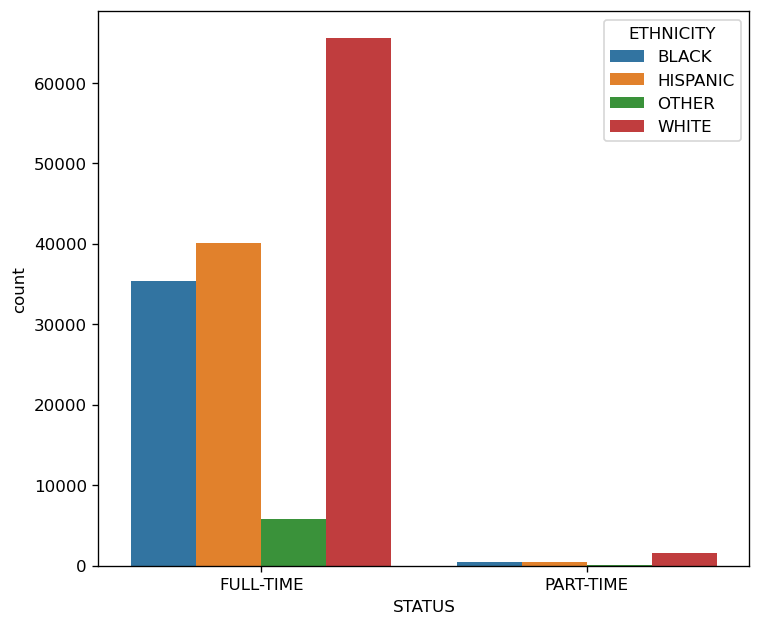

In [20]:
plt.figure(figsize=(7, 6), dpi=120)
sns.countplot(x='STATUS',data=df, hue='ETHNICITY')
plt.show()

Data is highily imbalance with respect to STATUS,
which may affect the predictions

🛠️ Fixes for imbalanced features:

🧹 Group rare categories together (e.g., into “Other”)

🧠 Use  Target encoding: Replace category with the mean of target variable for that category.

📊 If possible, collect more samples for rare groups

🪄 Use regularization to avoid overfitting to dominant groups

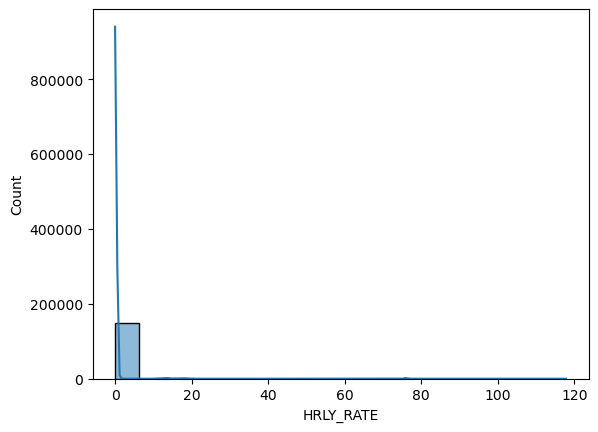

In [21]:
sns.histplot(x='HRLY_RATE',data=df,kde=True)
plt.show()

Data is highly skewed.

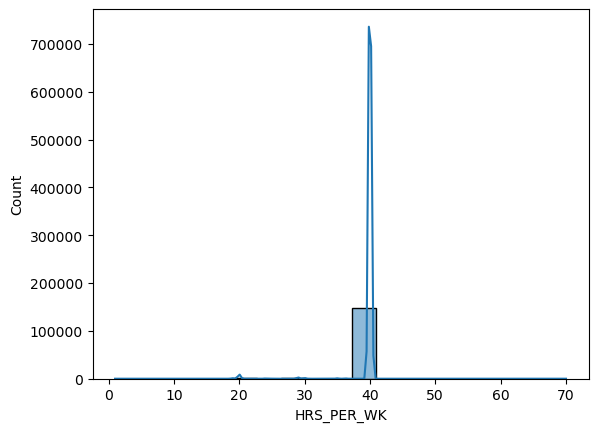

In [22]:
sns.histplot(x='HRS_PER_WK',data=df,kde=True,hue_norm='STATUS')
plt.show()

#### Majority of people earn between 37 to 42 $ per week.

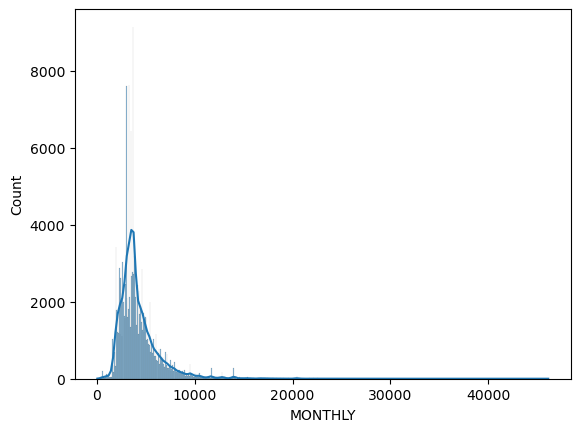

In [23]:
sns.histplot(x='MONTHLY',data=df,kde=True)
plt.show()

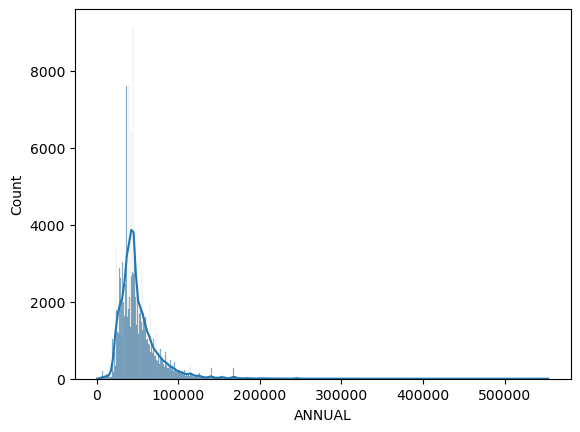

In [24]:
sns.histplot(x='ANNUAL',data=df,kde=True)
plt.show()

'HRLY RATE', 'HRS PER WK', 'MONTHLY', 'ANNUAL' has skewed data needs log transform to manage it


# Bivariate Analysis 

In [25]:
df.columns

Index(['AGENCY', 'AGENCY_NAME', 'CLASS_CODE', 'CLASS_TITLE', 'ETHNICITY',
       'GENDER', 'STATUS', 'EMPLOY_DATE', 'HRLY_RATE', 'HRS_PER_WK', 'MONTHLY',
       'ANNUAL', 'STATE_NUMBER'],
      dtype='object')

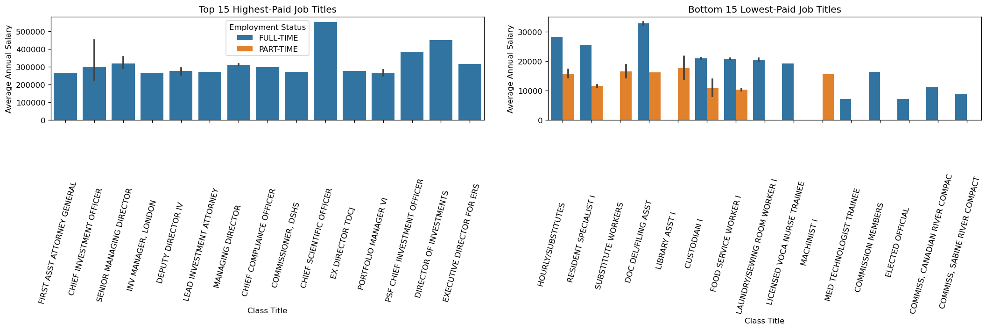

In [26]:
# --- Compute average annual salary by CLASS_TITLE ---
avg_salary = df.groupby('CLASS_TITLE')['ANNUAL'].mean().sort_values()

# --- Get top and bottom 15 job titles ---
top_15_titles = avg_salary.tail(15).index
bottom_15_titles = avg_salary.head(15).index

# --- Filter data for both ---
df_top = df[df['CLASS_TITLE'].isin(top_15_titles)]
df_bottom = df[df['CLASS_TITLE'].isin(bottom_15_titles)]

# --- Create two subplots ---
fig, axes = plt.subplots(1, 2, figsize=(18, 6), dpi=120)

# --- Plot 1: Top 15 Highest-Paid Roles ---
sns.barplot(x='CLASS_TITLE', y='ANNUAL', hue='STATUS', data=df_top, ax=axes[0])
axes[0].set_title('Top 15 Highest-Paid Job Titles')
axes[0].set_ylabel('Average Annual Salary')
axes[0].set_xlabel('Class Title')
axes[0].tick_params(axis='x', rotation=75)
axes[0].legend(title='Employment Status')

# --- Plot 2: Bottom 15 Lowest-Paid Roles ---
sns.barplot(x='CLASS_TITLE', y='ANNUAL', hue='STATUS', data=df_bottom, ax=axes[1])
axes[1].set_title('Bottom 15 Lowest-Paid Job Titles')
axes[1].set_ylabel('Average Annual Salary')
axes[1].set_xlabel('Class Title')
axes[1].tick_params(axis='x', rotation=75)
axes[1].legend([],[], frameon=False)  # Hide duplicate legend

# --- Final adjustments ---
plt.tight_layout()
plt.show()


graph is identical, thus we can go with monthly output of data which is more small and can help in both part time and full time job's classification.

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149481 entries, 0 to 149480
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   AGENCY        149481 non-null  int64   
 1   AGENCY_NAME   149481 non-null  object  
 2   CLASS_CODE    149481 non-null  object  
 3   CLASS_TITLE   149481 non-null  object  
 4   ETHNICITY     149481 non-null  category
 5   GENDER        149481 non-null  object  
 6   STATUS        149481 non-null  category
 7   EMPLOY_DATE   149481 non-null  object  
 8   HRLY_RATE     149481 non-null  float64 
 9   HRS_PER_WK    149481 non-null  float64 
 10  MONTHLY       149481 non-null  float64 
 11  ANNUAL        149481 non-null  float64 
 12  STATE_NUMBER  149481 non-null  int64   
dtypes: category(2), float64(4), int64(2), object(5)
memory usage: 12.8+ MB


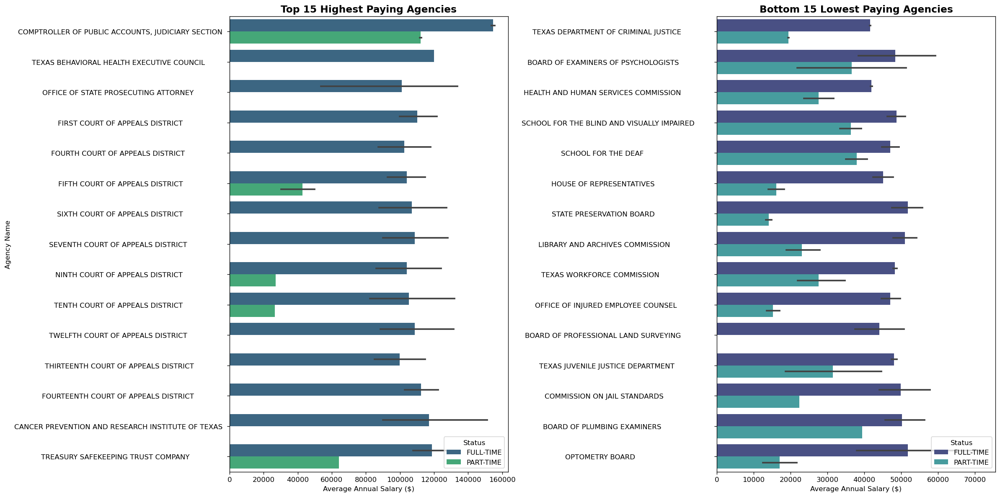

In [28]:

# --- 1️⃣ Compute average salary by agency ---
avg_salary = (
    df.groupby('AGENCY_NAME')['ANNUAL']
    .mean()
    .sort_values(ascending=False)
)

# --- 2️⃣ Get top 15 highest & lowest agencies ---
top_15_agencies = avg_salary.head(15).index
bottom_15_agencies = avg_salary.tail(15).index

# --- 3️⃣ Filter datasets ---
df_top = df[df['AGENCY_NAME'].isin(top_15_agencies)]
df_bottom = df[df['AGENCY_NAME'].isin(bottom_15_agencies)]

# --- 4️⃣ Create two subplots ---
fig, axes = plt.subplots(1, 2, figsize=(20, 10), dpi=120)

# --- 5️⃣ Top 15 Agencies (Highest) ---
sns.barplot(
    y='AGENCY_NAME',
    x='ANNUAL',
    hue='STATUS',
    data=df_top,
    palette='viridis',
    ax=axes[0]
)
axes[0].set_title('Top 15 Highest Paying Agencies', fontsize=14, weight='bold')
axes[0].set_xlabel('Average Annual Salary ($)')
axes[0].set_ylabel('Agency Name')

# --- 6️⃣ Bottom 15 Agencies (Lowest) ---
sns.barplot(
    y='AGENCY_NAME',
    x='ANNUAL',
    hue='STATUS',
    data=df_bottom,
    palette='mako',
    ax=axes[1]
)
axes[1].set_title('Bottom 15 Lowest Paying Agencies', fontsize=14, weight='bold')
axes[1].set_xlabel('Average Annual Salary ($)')
axes[1].set_ylabel('')

# --- 7️⃣ Clean up legends and layout ---
axes[0].legend(title='Status', loc='lower right')
axes[1].legend(title='Status', loc='lower right')

plt.tight_layout()
plt.show()


In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149481 entries, 0 to 149480
Data columns (total 13 columns):
 #   Column        Non-Null Count   Dtype   
---  ------        --------------   -----   
 0   AGENCY        149481 non-null  int64   
 1   AGENCY_NAME   149481 non-null  object  
 2   CLASS_CODE    149481 non-null  object  
 3   CLASS_TITLE   149481 non-null  object  
 4   ETHNICITY     149481 non-null  category
 5   GENDER        149481 non-null  object  
 6   STATUS        149481 non-null  category
 7   EMPLOY_DATE   149481 non-null  object  
 8   HRLY_RATE     149481 non-null  float64 
 9   HRS_PER_WK    149481 non-null  float64 
 10  MONTHLY       149481 non-null  float64 
 11  ANNUAL        149481 non-null  float64 
 12  STATE_NUMBER  149481 non-null  int64   
dtypes: category(2), float64(4), int64(2), object(5)
memory usage: 12.8+ MB


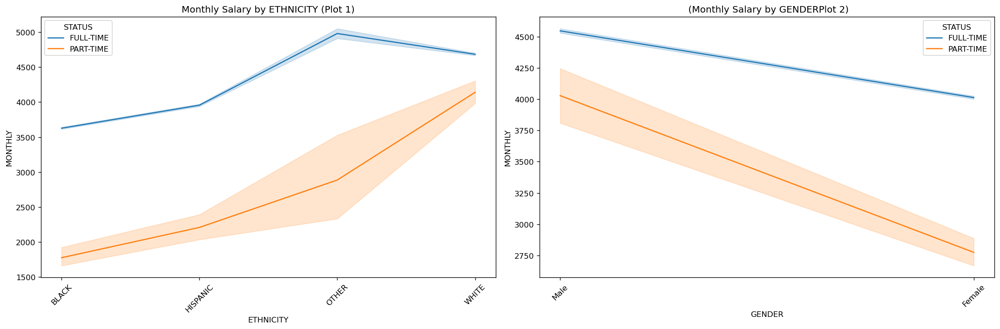

In [30]:
# Create figure with 1 row, 2 columns
fig, axes = plt.subplots(1, 2, figsize=(18,6), dpi=120)

# First line plot (subplot 1)
sns.lineplot(
    x='ETHNICITY',
    y='MONTHLY',
    data=df,
    hue='STATUS',
    ax=axes[0]  # first subplot
)
axes[0].set_title('Monthly Salary by ETHNICITY (Plot 1)')
axes[0].tick_params(axis='x', rotation=45)  # rotate x labels for readability

# Second line plot (subplot 2)
sns.lineplot(
    x='GENDER',
    y='MONTHLY',
    data=df,
    hue='STATUS',
    ax=axes[1]  # second subplot
)
axes[1].set_title(' (Monthly Salary by GENDERPlot 2)')
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()  # adjust spacing so titles/labels don’t overlap
plt.show()

## plot 1
#### 1. Black and Hispanic ethnic people's earning has a lot of differences.
#### 2. Other ethnicities earn more in full-time than any other ethnicity, despite being 3.9% of the whole demography.
#### 3. White ethnic people earn more as part-time workers than other ethnic groups, but they are the second-highest-earning ethnic group in Full-time segment.

### plot 2
#### 1. Males earn more in part-time than females.
#### 2. Males earn in part-time and full-time has less difference


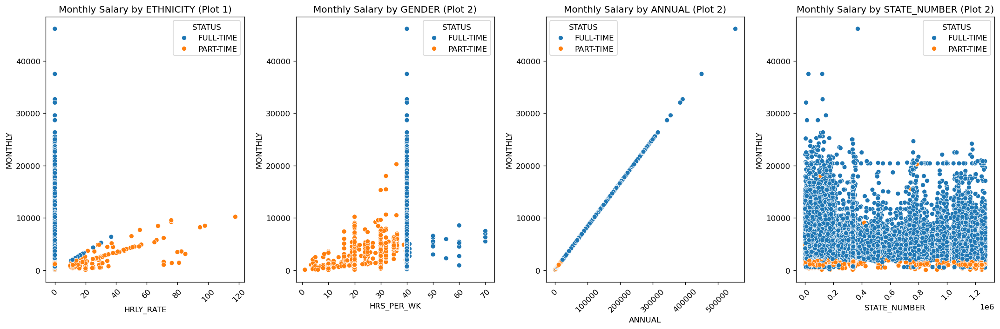

In [31]:
# Create figure with 1 row, 2 columns
fig, axes = plt.subplots(1, 4, figsize=(18,6), dpi=120)

# First line plot (subplot 1)
sns.scatterplot(
    x='HRLY_RATE',
    y='MONTHLY',
    data=df,
    hue='STATUS',
    ax=axes[0]  # first subplot
)
axes[0].set_title('Monthly Salary by ETHNICITY (Plot 1)')
axes[0].tick_params(axis='x', rotation=45)  # rotate x labels for readability

# Second line plot (subplot 2)
sns.scatterplot(
    x='HRS_PER_WK',
    y='MONTHLY',
    data=df,
    hue='STATUS',
    ax=axes[1]  # second subplot
)
axes[1].set_title('Monthly Salary by GENDER (Plot 2)')
axes[1].tick_params(axis='x', rotation=45)

# Third line plot (subplot 2)
sns.scatterplot(
    x='ANNUAL',
    y='MONTHLY',
    data=df,
    hue='STATUS',
    ax=axes[2]  # second subplot
)
axes[2].set_title('Monthly Salary by ANNUAL (Plot 2)')
axes[2].tick_params(axis='x', rotation=45)

# Fourth line plot (subplot 2)
sns.scatterplot(
    x='STATE_NUMBER',
    y='MONTHLY',
    data=df,
    hue='STATUS',
    ax=axes[3]  # second subplot
)
axes[3].set_title('Monthly Salary by STATE_NUMBER (Plot 2)')
axes[3].tick_params(axis='x', rotation=45)

plt.tight_layout()  # adjust spacing so titles/labels don’t overlap
plt.show()

# Multi-Variate Anlaysis

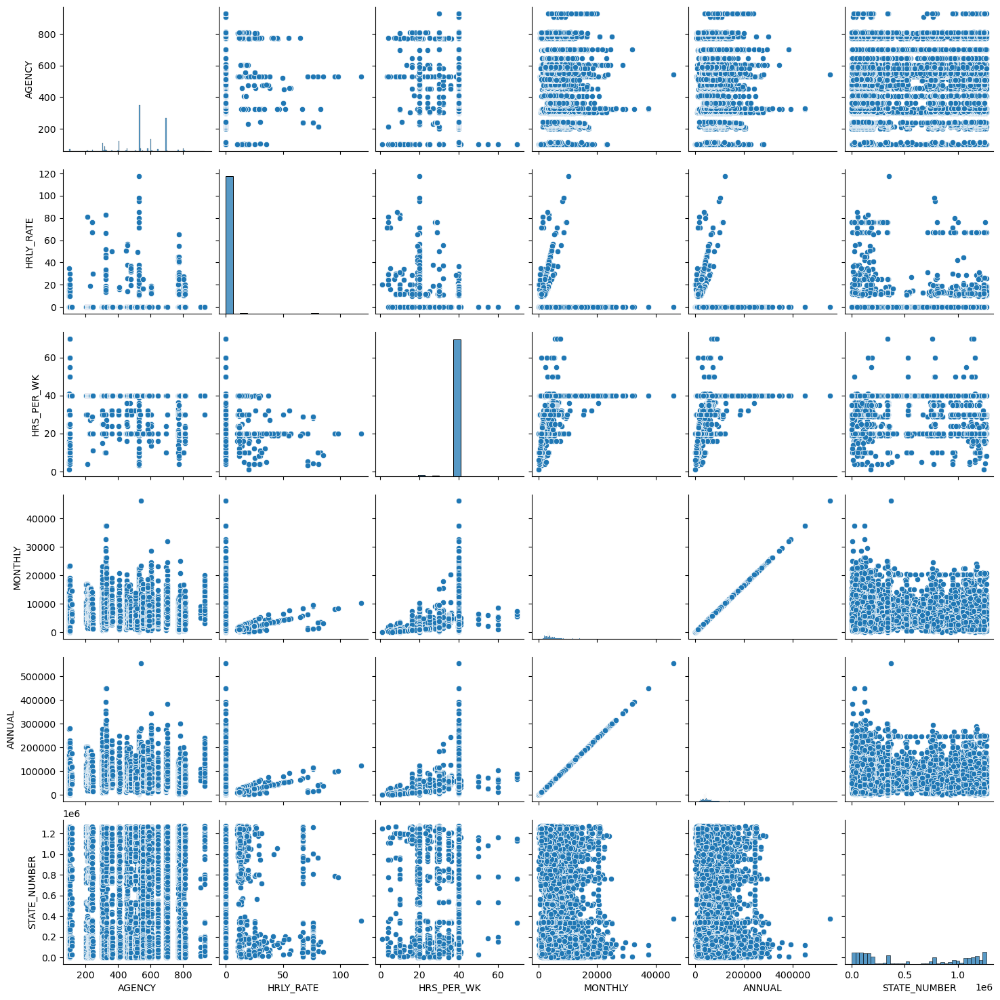

In [32]:
sns.pairplot(df)
plt.show()

1. Monthly and Annual has linear relationship, thus during cleaning any one column needs to be remove, so Annual column will be remove from the data because there are many fulltime and partime jobs and but while predicting for annual income partime earning seems to be little if work for limited months  thus goinig for monthly prediction is better.


disclaimer: above mention decssion could be change at the ML Modle building stage.


# Task 3:

### 1. Who are the outliers in the salaries?

In [33]:
# Annual basis outliers in the salaries
Q1 = df['ANNUAL'].quantile(0.25)   # 25th percentile
Q3 = df['ANNUAL'].quantile(0.75)   # 75th percentile
IQR = Q3 - Q1
# Define outlier thresholds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify outliers
outliers = df[(df['ANNUAL'] < lower_bound) | (df['ANNUAL'] > upper_bound)]

pd.DataFrame(outliers)

,AGENCY,AGENCY_NAME,CLASS_CODE,CLASS_TITLE,ETHNICITY,GENDER,STATUS,EMPLOY_DATE,HRLY_RATE,HRS_PER_WK,MONTHLY,ANNUAL,STATE_NUMBER
0,241,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...",JD25,"JUDGE, RETIRED ...",WHITE,Male,PART-TIME,02/18/88,75.9615,29.0,9545.82,114549.84,127717
2,241,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...",JD25,"JUDGE, RETIRED ...",WHITE,Male,PART-TIME,02/01/20,75.9615,29.0,9545.82,114549.84,59115
5,302,OFFICE OF THE ATTORNEY GENERAL ...,1623,DIRECTOR IV ...,HISPANIC,Female,FULL-TIME,04/01/20,0.0000,40.0,12899.00,154788.00,1177785
7,510,TEXAS BEHAVIORAL HEALTH EXECUTIVE COUNCIL ...,1623,DIRECTOR IV ...,WHITE,Male,FULL-TIME,03/01/20,0.0000,40.0,10000.00,120000.00,147334
36,101,SENATE ...,7101,LEG. OFFICIAL/ADMINISTRATOR ...,WHITE,Female,FULL-TIME,07/26/10,0.0000,40.0,8000.00,96000.00,49800
...,...,...,...,...,...,...,...,...,...,...,...,...,...
149374,809,STATE PRESERVATION BOARD ...,1623,DIRECTOR IV ...,WHITE,Female,FULL-TIME,01/23/13,0.0000,40.0,10583.34,127000.08,336971
149393,809,STATE PRESERVATION BOARD ...,1603,MGR IV ...,HISPANIC,Male,FULL-TIME,03/15/04,0.0000,40.0,8358.41,100300.92,9905
149401,809,STATE PRESERVATION BOARD ...,1602,MGR III ...,BLACK,Male,FULL-TIME,10/12/05,0.0000,40.0,7916.67,95000.04,38235
149415,809,STATE PRESERVATION BOARD ...,1622,DIRECTOR III ...,WHITE,Female,FULL-TIME,12/02/08,0.0000,40.0,10188.09,122257.08,52817


In [34]:
outlier_count = len(outliers)
total_count = len(df)
print(f"Outliers detected: {outlier_count} ({outlier_count/total_count:.2%} of data). This will handled in data-cleaning process.")

Outliers detected: 9031 (6.04% of data). This will handled in data-cleaning process.


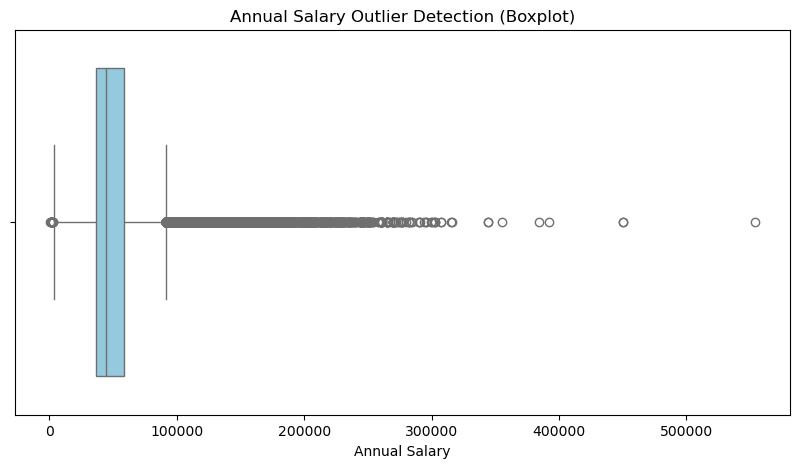

In [35]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
sns.boxplot(x=df['ANNUAL'], color='skyblue')
plt.title("Annual Salary Outlier Detection (Boxplot)")
plt.xlabel("Annual Salary")
plt.show()

### 2. What departments/roles have the biggest wage disparities between managers and employees?

In [36]:
import re
df['IS_MANAGER'] = df['CLASS_TITLE'].str.contains(
    r'\b(MANAGER|MGR|MNG)\b',
    flags=re.IGNORECASE,
    regex=True,
    na=False)
salary_gap = (
    df.groupby(['AGENCY_NAME', 'IS_MANAGER'])['ANNUAL']
    .mean()
    .unstack(fill_value=0)
    .reset_index()
)

salary_gap['WAGE_GAP'] = salary_gap[True] - salary_gap[False]
salary_gap['WAGE_GAP']

salary_gap_sorted = salary_gap.sort_values(by='WAGE_GAP', ascending=False)

wage=pd.DataFrame(salary_gap_sorted.head(1))
wage.rename({False:'Employees',True:'Managers'},axis=1, inplace=True)
wage

IS_MANAGER,AGENCY_NAME,Employees,Managers,WAGE_GAP
12,CANCER PREVENTION AND RESEARCH INSTITUTE OF TE...,114150.07125,214999.92,100849.84875


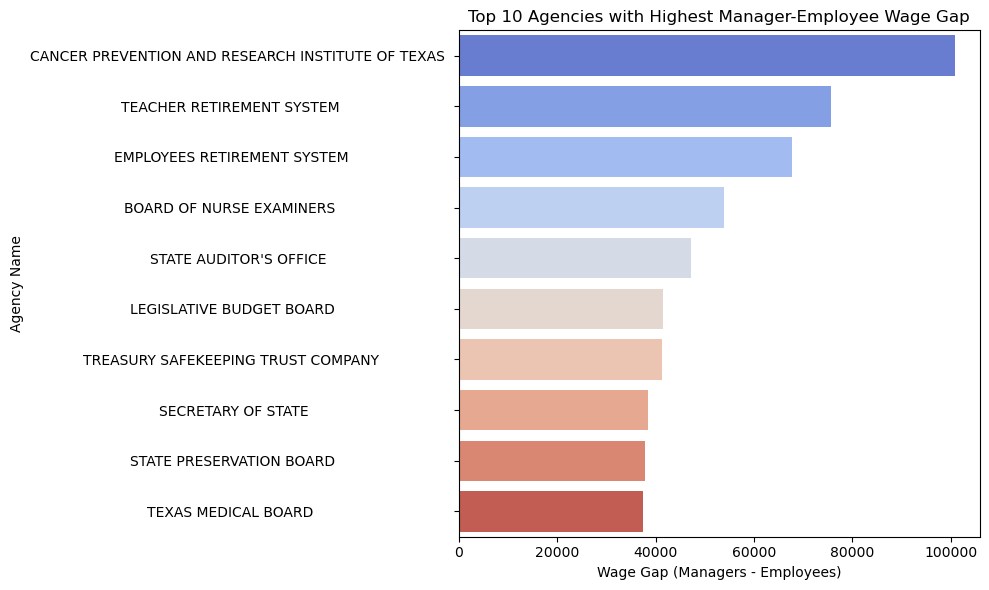

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

top10 = salary_gap_sorted.head(10)
plt.figure(figsize=(10,6))
sns.barplot(x='WAGE_GAP', y='AGENCY_NAME', data=top10, palette='coolwarm')
plt.title('Top 10 Agencies with Highest Manager-Employee Wage Gap')
plt.xlabel('Wage Gap (Managers - Employees)')
plt.ylabel('Agency Name')
plt.tight_layout()
plt.show()

### 3. Have salaries and total compensations for some roles/ departments/ head-count changed over time?

In [38]:
# salaries and total compensations for some departments changed over time

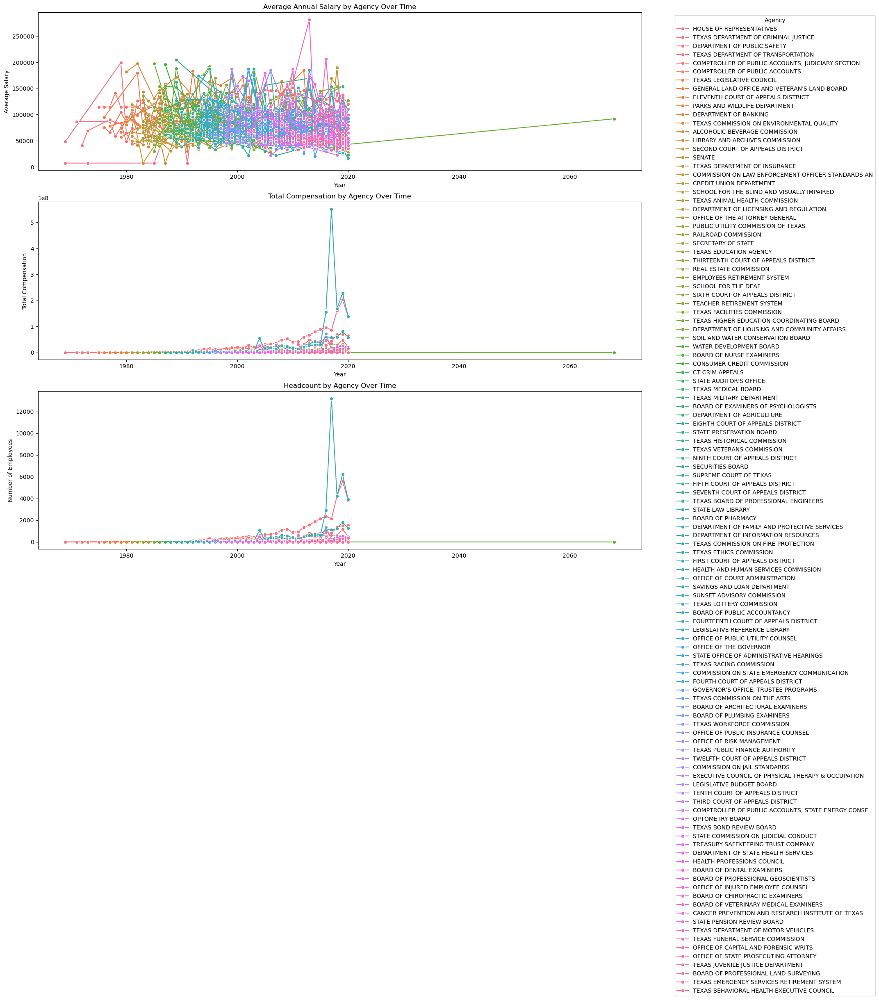

In [39]:
# --- Step 1: Prepare the data ---
df['EMPLOY_DATE'] = pd.to_datetime(df['EMPLOY_DATE'], format='%m/%d/%y', errors='coerce')
df['YEAR'] = df['EMPLOY_DATE'].dt.year

# Compute total compensation if not already in dataset
if 'TOTAL_COMPENSATION' not in df.columns:
    df['TOTAL_COMPENSATION'] = df['MONTHLY'] * 12

# --- Step 2: Aggregate by year and agency ---
agg_df = df.groupby(['YEAR', 'AGENCY_NAME']).agg(
    avg_salary=('ANNUAL', 'mean'),
    total_comp=('TOTAL_COMPENSATION', 'sum'),
    headcount=('STATE_NUMBER', 'count')
).reset_index()

# --- Step 3: Plotting ---
plt.figure(figsize=(19, 17))

# 3a: Average Salary
plt.subplot(3, 1, 1)
sns.lineplot(x='YEAR', y='avg_salary', hue='AGENCY_NAME', data=agg_df, marker='o')
plt.title("Average Annual Salary by Agency Over Time")
plt.ylabel("Average Salary")
plt.xlabel("Year")
plt.legend(title='Agency', bbox_to_anchor=(1.05, 1), loc='upper left')

# 3b: Total Compensation
plt.subplot(3, 1, 2)
sns.lineplot(x='YEAR', y='total_comp', hue='AGENCY_NAME', data=agg_df, marker='o')
plt.title("Total Compensation by Agency Over Time")
plt.ylabel("Total Compensation")
plt.xlabel("Year")
plt.legend([],[], frameon=False)  # hide legend to avoid duplicates

# 3c: Headcount
plt.subplot(3, 1, 3)
sns.lineplot(x='YEAR', y='headcount', hue='AGENCY_NAME', data=agg_df, marker='o')
plt.title("Headcount by Agency Over Time")
plt.ylabel("Number of Employees")
plt.xlabel("Year")
plt.legend([],[], frameon=False)

plt.tight_layout()
plt.show()


In [40]:

# --- Step 1: Prepare the data ---
df['EMPLOY_DATE'] = pd.to_datetime(df['EMPLOY_DATE'], format='%m/%d/%y', errors='coerce')
df['YEAR'] = df['EMPLOY_DATE'].dt.year

# Compute total compensation if not already in dataset
if 'TOTAL_COMPENSATION' not in df.columns:
    df['TOTAL_COMPENSATION'] = df['MONTHLY'] * 12

# --- Step 2: Aggregate by year and class title ---
agg_df_role = df.groupby(['YEAR', 'CLASS_TITLE']).agg(
    avg_salary=('ANNUAL', 'mean'),
    total_comp=('TOTAL_COMPENSATION', 'sum'),
    headcount=('STATE_NUMBER', 'count')
).reset_index()

# --- Step 3: Plotting ---
plt.figure(figsize=(18, 18))

# 3a: Average Salary by Role
plt.subplot(3, 1, 1)
sns.lineplot(x='YEAR', y='avg_salary', hue='CLASS_TITLE', data=agg_df_role, marker='o')
plt.title("Average Annual Salary by Role Over Time")
plt.ylabel("Average Salary")
plt.xlabel("Year")
plt.legend(title='Role', bbox_to_anchor=(1.05, 1), loc='upper left')

# 3b: Total Compensation by Role
plt.subplot(3, 1, 2)
sns.lineplot(x='YEAR', y='total_comp', hue='CLASS_TITLE', data=agg_df_role, marker='o')
plt.title("Total Compensation by Role Over Time")
plt.ylabel("Total Compensation")
plt.xlabel("Year")
plt.legend([],[], frameon=False)  # hide duplicate legend

# 3c: Headcount by Role
plt.subplot(3, 1, 3)
sns.lineplot(x='YEAR', y='headcount', hue='CLASS_TITLE', data=agg_df_role, marker='o')
plt.title("Headcount by Role Over Time")
plt.ylabel("Number of Employees")
plt.xlabel("Year")
plt.legend([],[], frameon=False)

plt.tight_layout()
plt.show()


# Data Cleanaing

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149481 entries, 0 to 149480
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   AGENCY              149481 non-null  int64         
 1   AGENCY_NAME         149481 non-null  object        
 2   CLASS_CODE          149481 non-null  object        
 3   CLASS_TITLE         149481 non-null  object        
 4   ETHNICITY           149481 non-null  category      
 5   GENDER              149481 non-null  object        
 6   STATUS              149481 non-null  category      
 7   EMPLOY_DATE         149481 non-null  datetime64[ns]
 8   HRLY_RATE           149481 non-null  float64       
 9   HRS_PER_WK          149481 non-null  float64       
 10  MONTHLY             149481 non-null  float64       
 11  ANNUAL              149481 non-null  float64       
 12  STATE_NUMBER        149481 non-null  int64         
 13  IS_MANAGER          149481 no

# Clean column names

In [42]:
df.columns = df.columns.str.strip().str.upper()
df.columns

Index(['AGENCY', 'AGENCY_NAME', 'CLASS_CODE', 'CLASS_TITLE', 'ETHNICITY',
       'GENDER', 'STATUS', 'EMPLOY_DATE', 'HRLY_RATE', 'HRS_PER_WK', 'MONTHLY',
       'ANNUAL', 'STATE_NUMBER', 'IS_MANAGER', 'YEAR', 'TOTAL_COMPENSATION'],
      dtype='object')

# Null values handeling

In [43]:
df.isna().sum()

AGENCY                0
AGENCY_NAME           0
CLASS_CODE            0
CLASS_TITLE           0
ETHNICITY             0
GENDER                0
STATUS                0
EMPLOY_DATE           0
HRLY_RATE             0
HRS_PER_WK            0
MONTHLY               0
ANNUAL                0
STATE_NUMBER          0
IS_MANAGER            0
YEAR                  0
TOTAL_COMPENSATION    0
dtype: int64

# Check Duplicte records

In [44]:
df.duplicated().sum()

np.int64(0)

In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149481 entries, 0 to 149480
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   AGENCY              149481 non-null  int64         
 1   AGENCY_NAME         149481 non-null  object        
 2   CLASS_CODE          149481 non-null  object        
 3   CLASS_TITLE         149481 non-null  object        
 4   ETHNICITY           149481 non-null  category      
 5   GENDER              149481 non-null  object        
 6   STATUS              149481 non-null  category      
 7   EMPLOY_DATE         149481 non-null  datetime64[ns]
 8   HRLY_RATE           149481 non-null  float64       
 9   HRS_PER_WK          149481 non-null  float64       
 10  MONTHLY             149481 non-null  float64       
 11  ANNUAL              149481 non-null  float64       
 12  STATE_NUMBER        149481 non-null  int64         
 13  IS_MANAGER          149481 no

In [46]:
df.columns

Index(['AGENCY', 'AGENCY_NAME', 'CLASS_CODE', 'CLASS_TITLE', 'ETHNICITY',
       'GENDER', 'STATUS', 'EMPLOY_DATE', 'HRLY_RATE', 'HRS_PER_WK', 'MONTHLY',
       'ANNUAL', 'STATE_NUMBER', 'IS_MANAGER', 'YEAR', 'TOTAL_COMPENSATION'],
      dtype='object')

# Outlier Handeling

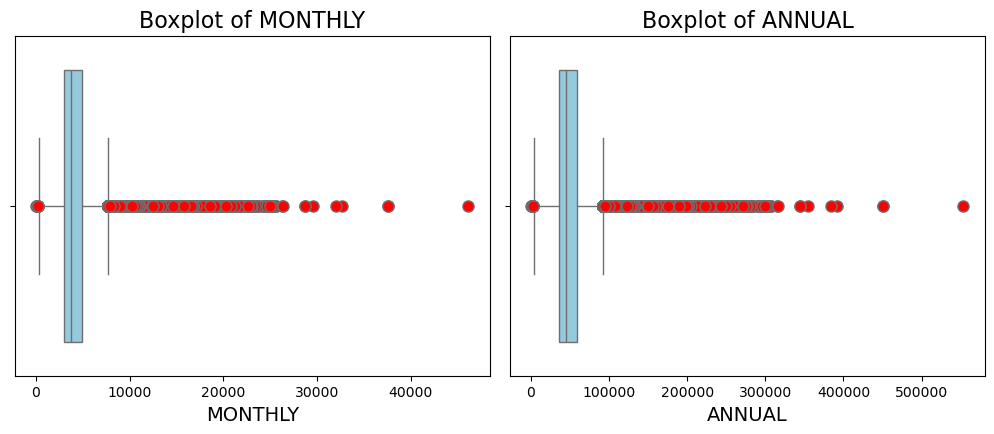

In [47]:
# Assuming 'df' is your DataFrame
cols=['MONTHLY','ANNUAL']
plt.figure(figsize=(15, 8), facecolor='white')  # Adjusted canvas size for better visibility
plotnumber = 1

for column in cols:
    plt.subplot(2, 3, plotnumber)  # 2 rows, 3 columns grid
    sns.boxplot(x=df[column], color='skyblue', flierprops={'marker': 'o', 'markerfacecolor': 'red', 'markersize': 8})
    plt.xlabel(column, fontsize=14)
    plt.title(f'Boxplot of {column}', fontsize=16)
    plotnumber += 1

plt.tight_layout()  # Prevents overlapping labels
plt.show()


--- MONTHLY ---
Original range: 50.00 to 46125.00
IQR: 1845.97
Lower bound: 250.88
Upper bound: 7634.77
Outliers below lower bound: 13
Outliers above upper bound: 9018

--- ANNUAL ---
Original range: 600.00 to 553500.00
IQR: 22151.64
Lower bound: 3010.62
Upper bound: 91617.18
Outliers below lower bound: 13
Outliers above upper bound: 9018


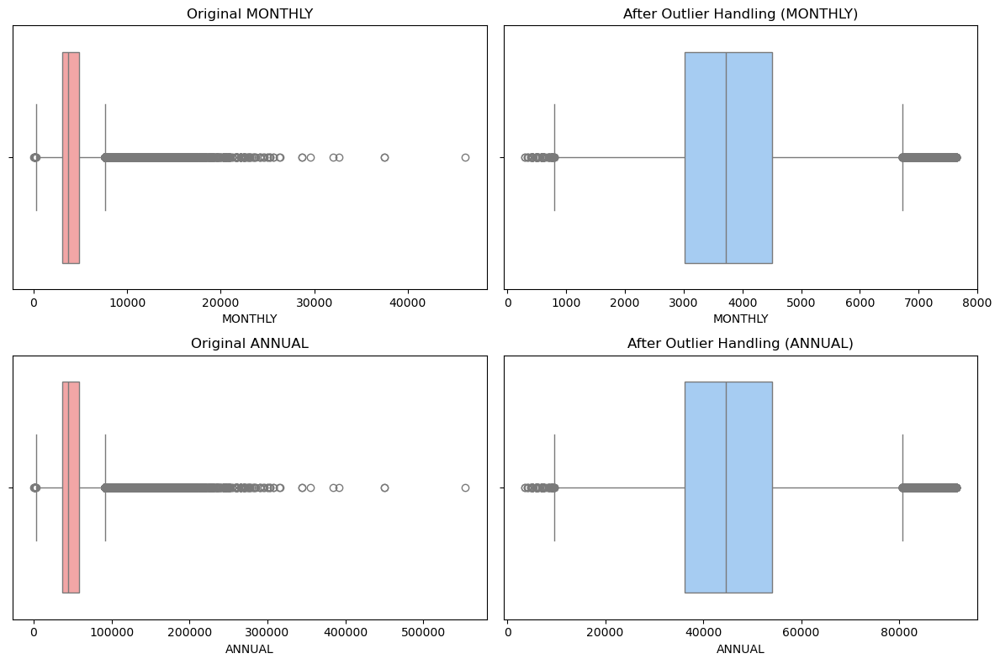

In [48]:
def handle_outliers_and_plot(df, columns_to_process):
    """
    Handle outliers using IQR method and create before/after boxplot comparisons.

    Parameters:
        df (pd.DataFrame): Input DataFrame
        columns_to_process (list): List of column names to process

    Returns:
        df_capped (pd.DataFrame): DataFrame with outliers capped to median.
    """

    # 🧹 Clean column names (remove spaces and uppercase for consistency)
    df.columns = df.columns.str.strip().str.upper()
    df_capped = df.copy()

    # Convert column list to uppercase too (to match)
    columns_to_process = [col.strip().upper() for col in columns_to_process]

    # Set up figure layout
    n_cols = 2  # Before and After
    n_rows = len(columns_to_process)
    plt.figure(figsize=(12, 4 * n_rows))

    for i, column in enumerate(columns_to_process, 1):
        if column not in df.columns:
            print(f"⚠️ Column '{column}' not found in DataFrame. Skipping...")
            continue

        # Calculate IQR and bounds
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        min_limit = Q1 - 1.5 * IQR
        max_limit = Q3 + 1.5 * IQR

        # Print summary
        print(f"\n--- {column} ---")
        print(f"Original range: {df[column].min():.2f} to {df[column].max():.2f}")
        print(f"IQR: {IQR:.2f}")
        print(f"Lower bound: {min_limit:.2f}")
        print(f"Upper bound: {max_limit:.2f}")
        print(f"Outliers below lower bound: {(df[column] < min_limit).sum()}")
        print(f"Outliers above upper bound: {(df[column] > max_limit).sum()}")

        # Cap outliers to median
        median_val = df[column].median()
        df_capped.loc[df_capped[column] < min_limit, column] = median_val
        df_capped.loc[df_capped[column] > max_limit, column] = median_val

        # 📊 Plot before and after
        plt.subplot(n_rows, n_cols, (i - 1) * 2 + 1)
        sns.boxplot(x=df[column], color="#FF9999")
        plt.title(f"Original {column}")

        plt.subplot(n_rows, n_cols, (i - 1) * 2 + 2)
        sns.boxplot(x=df_capped[column], color="#99CCFF")
        plt.title(f"After Outlier Handling ({column})")

    plt.tight_layout()
    plt.show()

    return df_capped


# 🧠 Example usage:
columns_to_process = ['MONTHLY', 'ANNUAL']
df_cleaned = handle_outliers_and_plot(df, columns_to_process)


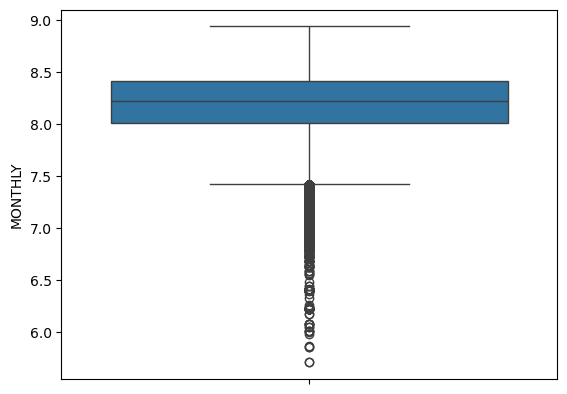

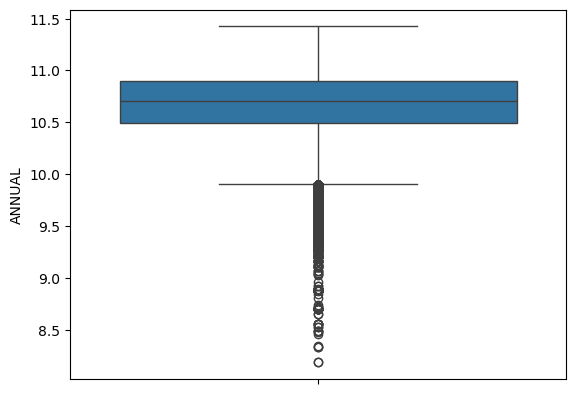

In [49]:
df_cleaned[columns_to_process]=np.log(df_cleaned[columns_to_process])
for col in columns_to_process:
    sns.boxplot(df_cleaned[col])
    plt.show()
    col=+1

# Categorical data handleing

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 149481 entries, 0 to 149480
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   AGENCY              149481 non-null  int64         
 1   AGENCY_NAME         149481 non-null  object        
 2   CLASS_CODE          149481 non-null  object        
 3   CLASS_TITLE         149481 non-null  object        
 4   ETHNICITY           149481 non-null  category      
 5   GENDER              149481 non-null  object        
 6   STATUS              149481 non-null  category      
 7   EMPLOY_DATE         149481 non-null  datetime64[ns]
 8   HRLY_RATE           149481 non-null  float64       
 9   HRS_PER_WK          149481 non-null  float64       
 10  MONTHLY             149481 non-null  float64       
 11  ANNUAL              149481 non-null  float64       
 12  STATE_NUMBER        149481 non-null  int64         
 13  IS_MANAGER          149481 no

In [51]:
from sklearn.preprocessing import LabelEncoder
lc=LabelEncoder()
df_cleaned['GENDER']=lc.fit_transform(df_cleaned['GENDER'])

In [52]:
df_cleaned['ETHNICITY']=lc.fit_transform(df_cleaned['ETHNICITY'])
df_cleaned['STATUS']=lc.fit_transform(df_cleaned['STATUS'])

In [53]:
df_cleaned.head()

,AGENCY,AGENCY_NAME,CLASS_CODE,CLASS_TITLE,ETHNICITY,GENDER,STATUS,EMPLOY_DATE,HRLY_RATE,HRS_PER_WK,MONTHLY,ANNUAL,STATE_NUMBER,IS_MANAGER,YEAR,TOTAL_COMPENSATION
0,241,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...",JD25,"JUDGE, RETIRED ...",3,1,1,1988-02-18,75.96150,29.0,8.221525,10.706431,127717,False,1988,114549.84
1,212,OFFICE OF COURT ADMINISTRATION ...,3524,GENERAL COUNSEL IV ...,3,1,1,2015-02-01,81.04454,4.0,7.247629,9.732536,127717,False,2015,16857.24
2,241,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...",JD25,"JUDGE, RETIRED ...",3,1,1,2020-02-01,75.96150,29.0,8.221525,10.706431,59115,False,2020,114549.84
3,212,OFFICE OF COURT ADMINISTRATION ...,3524,GENERAL COUNSEL IV ...,3,1,1,2018-09-01,81.04453,4.0,7.247629,9.732536,59115,False,2018,16857.24
4,696,TEXAS DEPARTMENT OF CRIMINAL JUSTICE ...,4504,CORREC OFFICER IV ...,1,0,0,2020-06-29,0.00000,40.0,8.096900,10.581806,165030,False,2020,39411.24


In [54]:
import category_encoders as ce
# Frequency Encoder
freq_encoder = ce.CountEncoder(cols=['CLASS_TITLE', 'AGENCY_NAME'],normalize=True)

df_freq = freq_encoder.fit_transform(df_cleaned)
df_freq


,AGENCY,AGENCY_NAME,CLASS_CODE,CLASS_TITLE,ETHNICITY,GENDER,STATUS,EMPLOY_DATE,HRLY_RATE,HRS_PER_WK,MONTHLY,ANNUAL,STATE_NUMBER,IS_MANAGER,YEAR,TOTAL_COMPENSATION
0,241,0.006911,JD25,0.002167,3,1,1,1988-02-18,75.96150,29.0,8.221525,10.706431,127717,False,1988,114549.84
1,212,0.001779,3524,0.000314,3,1,1,2015-02-01,81.04454,4.0,7.247629,9.732536,127717,False,2015,16857.24
2,241,0.006911,JD25,0.002167,3,1,1,2020-02-01,75.96150,29.0,8.221525,10.706431,59115,False,2020,114549.84
3,212,0.001779,3524,0.000314,3,1,1,2018-09-01,81.04453,4.0,7.247629,9.732536,59115,False,2018,16857.24
4,696,0.240338,4504,0.061995,1,0,0,2020-06-29,0.00000,40.0,8.096900,10.581806,165030,False,2020,39411.24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149476,809,0.001478,6232,0.002576,3,1,0,2017-10-30,0.00000,40.0,7.972121,10.457028,770781,False,2017,34788.00
149477,809,0.001478,0302,0.000321,3,0,0,2015-07-13,0.00000,40.0,8.612503,11.097410,847431,False,2015,66000.00
149478,809,0.001478,0130,0.001478,3,1,1,2012-10-15,12.93000,20.0,7.021620,9.506526,34266,False,2012,13447.20
149479,809,0.001478,1572,0.007238,3,1,0,1989-09-22,0.00000,40.0,8.655939,11.140846,123490,False,1989,68929.92


# Feature Engineering

In [55]:
df_freq.drop(['AGENCY','CLASS_CODE','STATE_NUMBER'], axis=1, inplace=True)

In [56]:
df_freq.drop('EMPLOY_DATE', axis=1,inplace=True)

In [57]:
df_freq.head()

,AGENCY_NAME,CLASS_TITLE,ETHNICITY,GENDER,STATUS,HRLY_RATE,HRS_PER_WK,MONTHLY,ANNUAL,IS_MANAGER,YEAR,TOTAL_COMPENSATION
0,0.006911,0.002167,3,1,1,75.96150,29.0,8.221525,10.706431,False,1988,114549.84
1,0.001779,0.000314,3,1,1,81.04454,4.0,7.247629,9.732536,False,2015,16857.24
2,0.006911,0.002167,3,1,1,75.96150,29.0,8.221525,10.706431,False,2020,114549.84
3,0.001779,0.000314,3,1,1,81.04453,4.0,7.247629,9.732536,False,2018,16857.24
4,0.240338,0.061995,1,0,0,0.00000,40.0,8.096900,10.581806,False,2020,39411.24


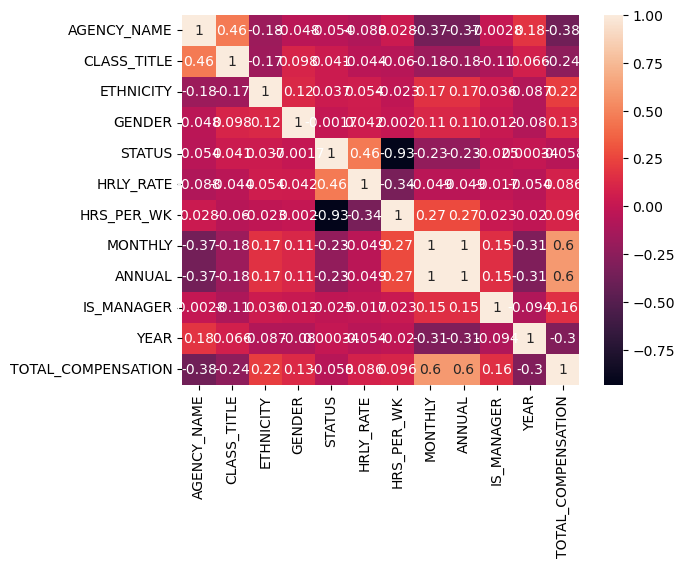

In [58]:
sns.heatmap(df_freq.corr(),annot=True)
plt.show()

Columns removed 'HRS_PER_WK', is less related and "ANNUAL" both removed  for their correlation is beyond -0.9 and 0.9

In [59]:
df_freq.columns

Index(['AGENCY_NAME', 'CLASS_TITLE', 'ETHNICITY', 'GENDER', 'STATUS',
       'HRLY_RATE', 'HRS_PER_WK', 'MONTHLY', 'ANNUAL', 'IS_MANAGER', 'YEAR',
       'TOTAL_COMPENSATION'],
      dtype='object')

In [60]:
df_freq.drop(['HRS_PER_WK','ANNUAL','IS_MANAGER','YEAR', 'TOTAL_COMPENSATION'],axis=1,inplace=True)

In [61]:
df_freq.drop(['HRLY_RATE'],axis=1,inplace=True)

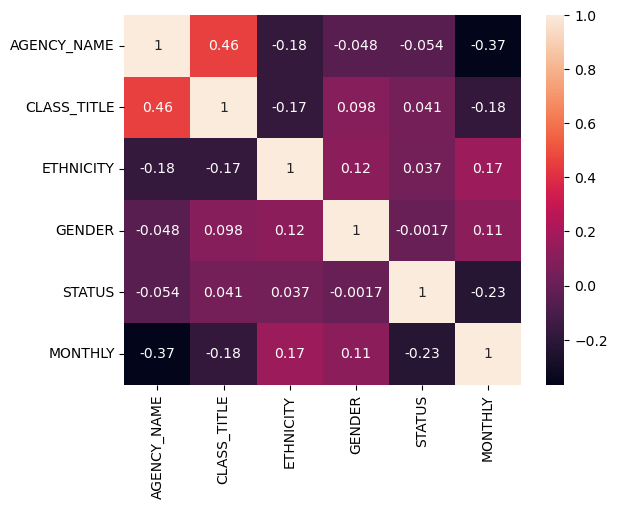

In [62]:
sns.heatmap(df_freq.corr(),annot=True)
plt.show()

In [63]:
from sklearn.preprocessing import MinMaxScaler
scaled=MinMaxScaler()
df_scaled=scaled.fit_transform(df_freq)

In [64]:
df_new = pd.DataFrame(df_scaled, columns=df_freq.columns)

# Model Testing

In [65]:

X=df_new.drop(['MONTHLY'],axis=1)
y=df_new['MONTHLY']

In [66]:
df_new

,AGENCY_NAME,CLASS_TITLE,ETHNICITY,GENDER,STATUS,MONTHLY
0,0.028146,0.034859,1.000000,1.0,1.0,0.777901
1,0.007227,0.004964,1.000000,1.0,1.0,0.476999
2,0.028146,0.034859,1.000000,1.0,1.0,0.777901
3,0.007227,0.004964,1.000000,1.0,1.0,0.476999
4,0.979791,1.000000,0.333333,0.0,0.0,0.739396
...,...,...,...,...,...,...
149476,0.006000,0.041442,1.000000,1.0,0.0,0.700843
149477,0.006000,0.005072,1.000000,0.0,0.0,0.898701
149478,0.006000,0.023743,1.000000,1.0,1.0,0.407169
149479,0.006000,0.116663,1.000000,1.0,0.0,0.912121


In [67]:
X.columns

Index(['AGENCY_NAME', 'CLASS_TITLE', 'ETHNICITY', 'GENDER', 'STATUS'], dtype='object')

In [68]:
from sklearn.model_selection import train_test_split, cross_val_score, KFold
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)


✅ Model Performance Comparison:
                              Model  Test RMSE  CV RMSE     R²  Adjusted R²
2                     Random Forest      0.042  Skipped  0.837        0.837
1                     Decision Tree      0.044  Skipped  0.818        0.818
4                               KNN      0.051  Skipped  0.758        0.758
6                   XGBoost Default      0.059  Skipped  0.672        0.672
3                 Gradient Boosting      0.067    0.068  0.576        0.576
5                               SVR      0.090  Skipped  0.248        0.248
0                 Linear Regression      0.092    0.092  0.208        0.207
7  SGD Regressor (Gradient Descent)      0.092    0.092  0.207        0.207


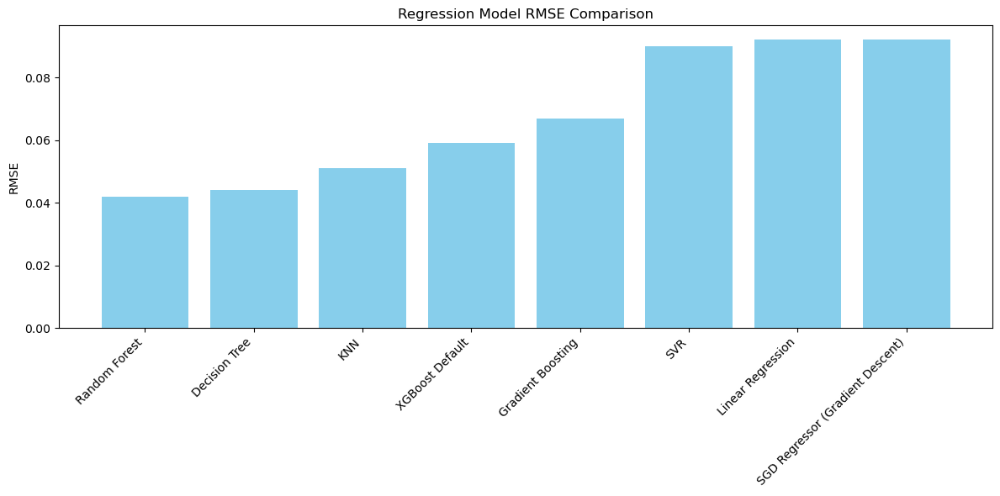

<Figure size 1200x600 with 0 Axes>

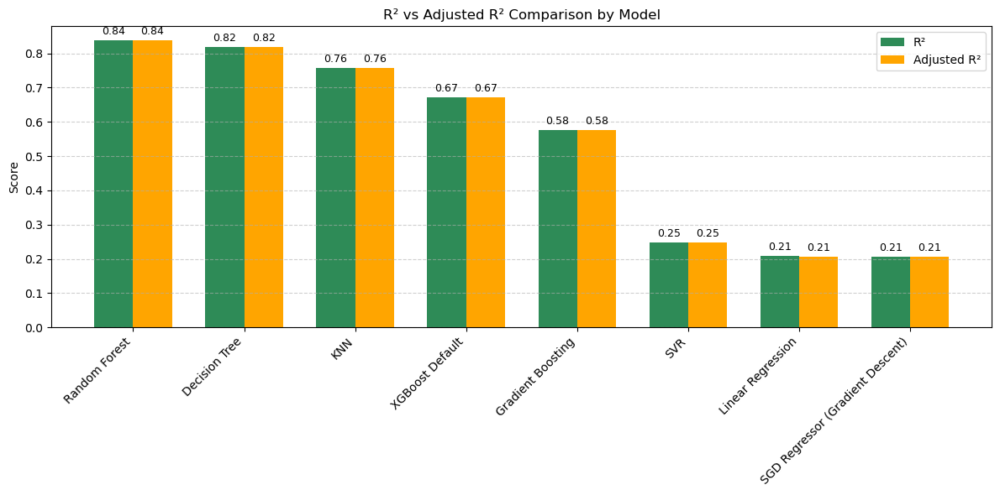

In [69]:
# ----------------------------
# 📊 MULTIPLE REGRESSION MODELS TESTING (Optimized)
# ----------------------------

# Regression Models
from sklearn.linear_model import LinearRegression, SGDRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR
import xgboost as xgb

# Evaluation

from sklearn.metrics import mean_squared_error, r2_score

# Get shape for Adjusted R²
n_samples, n_features = X_test.shape

# ----------------------------
# ⚙️ Define Models (lighter + parallel)
# ----------------------------
models = {
    "Linear Regression": LinearRegression(),
    "Decision Tree": DecisionTreeRegressor(random_state=42),
    "Random Forest": RandomForestRegressor(),
    "Gradient Boosting": GradientBoostingRegressor(),
    "KNN": KNeighborsRegressor(),
    "SVR": SVR(),
    "XGBoost Default": xgb.XGBRegressor(
        n_estimators=100,
        max_depth=3,
        eval_metric='rmse',
        use_label_encoder=False,
        n_jobs=-1,
        random_state=42
    ),
    "SGD Regressor (Gradient Descent)": SGDRegressor(
        loss='squared_error',
        max_iter=1000,
        tol=1e-3,
        random_state=42
    )
}

# ----------------------------
# 🏎️ Evaluation Loop
# ----------------------------
cv = KFold(n_splits=5, shuffle=True, random_state=42)  # less folds = faster

results = []

for name, model in models.items():
    # Train
    model.fit(X_train, y_train)
    # Predict
    y_pred = model.predict(X_test)

    # Metrics
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    test_r2 = r2_score(y_test, y_pred)
    adj_r2 = 1 - (1 - test_r2) * (n_samples - 1) / (n_samples - n_features - 1)

    # ⚡ Cross-validation only for light models
    if name in ["Linear Regression", "SGD Regressor (Gradient Descent)","Gradient Boosting"]:
        cv_mse = -cross_val_score(model, X, y, cv=cv, scoring='neg_mean_squared_error', n_jobs=-1)
        cv_rmse = np.sqrt(cv_mse.mean())
    else:
        cv_rmse = np.nan  # Skipped to save time

    results.append({
        "Model": name,
        "Test RMSE": round(test_rmse, 3),
        "CV RMSE": round(cv_rmse, 3) if not np.isnan(cv_rmse) else "Skipped",
        "R²": round(test_r2, 3),
        "Adjusted R²": round(adj_r2, 3)
    })

# ----------------------------
# 📊 Results Table
# ----------------------------
results_df = pd.DataFrame(results).sort_values(by="Test RMSE")
print("\n✅ Model Performance Comparison:")
print(results_df)

# ----------------------------
# 📈 Visualization
# ----------------------------
plt.figure(figsize=(12,6))
plt.bar(results_df['Model'], results_df['Test RMSE'], color='skyblue')
plt.title("Regression Model RMSE Comparison")
plt.ylabel("RMSE")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# ----------------------------
# 📈 Visualization of R² and Adjusted R²
# ----------------------------
plt.figure(figsize=(12,6))

# Plot R² vs Adjusted R² side-by-side
x = np.arange(len(results_df['Model']))  # the label locations
width = 0.35  # width of the bars

fig, ax = plt.subplots(figsize=(12,6))
r2_bars = ax.bar(x - width/2, results_df['R²'], width, label='R²', color='seagreen')
adjr2_bars = ax.bar(x + width/2, results_df['Adjusted R²'], width, label='Adjusted R²', color='orange')

# Title and labels
ax.set_ylabel('Score')
ax.set_title('R² vs Adjusted R² Comparison by Model')
ax.set_xticks(x)
ax.set_xticklabels(results_df['Model'], rotation=45, ha='right')
ax.legend()
ax.grid(axis='y', linestyle='--', alpha=0.6)

# Annotate values on top of bars
for bars in [r2_bars, adjr2_bars]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.2f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()


In [70]:
n_samples, n_features = X_test.shape

In [71]:
from sklearn.linear_model import LinearRegression
LR=LinearRegression()
LR.fit(X_train,y_train)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [72]:
y_pred_lr=LR.predict(X_test)

In [73]:
from sklearn.metrics import r2_score,root_mean_squared_error
r2_lr=r2_score(y_test,y_pred_lr)
r2_lr

0.20751632338501425

In [74]:
q90 = np.quantile(y_train, 0.90)
q10 = np.quantile(y_train, 0.10)

weights = np.where(
    (y_train >= q90) | (y_train <= q10),  # rare extremes
    5,  # high weight
    1   # normal weight
)
weights = weights / np.mean(weights)


In [75]:
from sklearn.tree import DecisionTreeRegressor
dt=DecisionTreeRegressor()
dt.fit(X_train,y_train,sample_weight=weights)

,criterion,'squared_error'
,splitter,'best'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,None
,random_state,None
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,ccp_alpha,0.0


In [76]:
from sklearn.metrics import r2_score,root_mean_squared_error
y_pred_dt=dt.predict(X_test)
r2_dt=r2_score(y_test,y_pred_dt)
r2_dt

0.7870318224545158

In [77]:
adj_r2= 1 - (1 - r2_dt) * (n_samples - 1) / (n_samples - n_features - 1)
adj_r2

0.786996198323917

In [78]:
y_pred_train=dt.predict(X_train)
r2_score_train=r2_score(y_train, y_pred_train)
r2_score_train

0.8662732644243525

In [79]:
adj_r2_train= 1 - (1 - r2_score_train) * (n_samples - 1) / (n_samples - n_features - 1)
adj_r2_train

0.8662508953608257

In [80]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor()
rf.fit(X_train,y_train)

,n_estimators,100
,criterion,'squared_error'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,1.0
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [81]:
y_pred_test_rf=rf.predict(X_test)
r2_test=r2_score(y_test, y_pred_test_rf)
r2_test

0.8364881086572429

In [82]:
adj_r2_rf=1 - (1 - r2_test) * (n_samples - 1) / (n_samples - n_features - 1)
adj_r2_rf

0.8364607572987499

# Hyperparameter Tuening

In [83]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV

param_grid = {
    'criterion': ['squared_error', 'friedman_mse', 'poisson', 'absolute_error'],
    'max_depth': [None, 3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'max_features': [None, 'sqrt', 'log2'],
    'splitter': ['best', 'random']
}


grid_search = HalvingGridSearchCV(
    estimator=dt,
    param_grid=param_grid,
    cv=3,               # 5-fold cross validation
    scoring='accuracy', # or f1, roc_auc, etc.
    n_jobs=-1,
    verbose=1
)
# 5. Fit
grid_search.fit(X_train, y_train)

# 6. Results
print("Best Parameters:", grid_search.best_params_)
print("Best CV Score:", grid_search.best_score_)

best_model = grid_search.best_estimator_
print("Test Accuracy:", best_model.score(X_test, y_test))


n_iterations: 7
n_required_iterations: 7
n_possible_iterations: 7
min_resources_: 164
max_resources_: 119584
aggressive_elimination: False
factor: 3
----------
iter: 0
n_candidates: 864
n_resources: 164
Fitting 3 folds for each of 864 candidates, totalling 2592 fits
----------
iter: 1
n_candidates: 288
n_resources: 492
Fitting 3 folds for each of 288 candidates, totalling 864 fits
----------
iter: 2
n_candidates: 96
n_resources: 1476
Fitting 3 folds for each of 96 candidates, totalling 288 fits
----------
iter: 3
n_candidates: 32
n_resources: 4428
Fitting 3 folds for each of 32 candidates, totalling 96 fits
----------
iter: 4
n_candidates: 11
n_resources: 13284
Fitting 3 folds for each of 11 candidates, totalling 33 fits
----------
iter: 5
n_candidates: 4
n_resources: 39852
Fitting 3 folds for each of 4 candidates, totalling 12 fits
----------
iter: 6
n_candidates: 2
n_resources: 119556
Fitting 3 folds for each of 2 candidates, totalling 6 fits
Best Parameters: {'criterion': 'absolute_

## Hyperparameter Tuning may not wrok well because:
Tuning ≠ guaranteed improvement.
Tuning is about finding a potentially better configuration, but the baseline can sometimes win.

# ⚖️ Model Comparison Report ⚖️

### 🏆 Random Forest Wins 🏆 

# Create a pipeline

In [2]:
data2 = pd.read_csv('salary.csv',usecols=['AGENCY NAME','CLASS TITLE', 'ETHNICITY', 'GENDER', 'STATUS', 'ANNUAL'])
data2.head()

,AGENCY NAME,CLASS TITLE,ETHNICITY,GENDER,STATUS,ANNUAL
0,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...","JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,114549.84
1,OFFICE OF COURT ADMINISTRATION ...,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,16857.24
2,"COMPTROLLER OF PUBLIC ACCOUNTS, JUDICIARY SECT...","JUDGE, RETIRED ...",WHITE,MALE,URP - UNCLASSIFIED REGULAR PART-TIME,114549.84
3,OFFICE OF COURT ADMINISTRATION ...,GENERAL COUNSEL IV ...,WHITE,MALE,CTP - CLASSIFIED TEMPORARY PART-TIME,16857.24
4,TEXAS DEPARTMENT OF CRIMINAL JUSTICE ...,CORREC OFFICER IV ...,HISPANIC,FEMALE,CRF - CLASSIFIED REGULAR FULL-TIME,39411.24


In [3]:
data2.columns

Index(['AGENCY NAME', 'CLASS TITLE', 'ETHNICITY', 'GENDER', 'STATUS',
       'ANNUAL'],
      dtype='object')

In [4]:
from sklearn import set_config
set_config(display='diagram')

import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor
import category_encoders as ce
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
from sklearn.model_selection import train_test_split

# Assuming data2 is your DataFrame
df_pipe = data2[['AGENCY NAME','CLASS TITLE', 'ETHNICITY', 'GENDER', 'STATUS', 'ANNUAL']].copy()

# -------------------------------------------------------------------
# Preprocessing: Handle column names and data cleaning BEFORE pipeline
# -------------------------------------------------------------------

# 1. Clean column names first (do this once before splitting)
df_pipe.columns = [col.replace(' ', '_') for col in df_pipe.columns]

# 2. Pre-clean the data (do this before train/test split)
def pre_clean_data(df):
    """Clean the data before splitting into train/test"""
    df_clean = df.copy()
    
    # Clean ETHNICITY
    ethnicity_mapping = {'AM INDIAN': 'OTHER', 'ASIAN': 'OTHER'}
    df_clean['ETHNICITY'] = (
        df_clean['ETHNICITY']
        .astype(str)
        .str.strip()
        .replace(ethnicity_mapping)
    )
    
    # Clean STATUS
    status_mapping = {
        'CRF - CLASSIFIED REGULAR FULL-TIME': 'FULL-TIME',
        'URF - UNCLASSIFIED REGULAR FULL-TIME': 'FULL-TIME',
        'CRP - CLASSIFIED REGULAR PART-TIME': 'PART-TIME',
        'CTF - CLASSIFIED TEMPORARY FULL-TIME': 'FULL-TIME',
        'URP - UNCLASSIFIED REGULAR PART-TIME': 'PART-TIME',
        'ERF - EXEMPT REGULAR FULL-TIME': 'FULL-TIME',
        'CTP - CLASSIFIED TEMPORARY PART-TIME': 'PART-TIME',
        'UTP - UNCLASSIFIED TEMPORARY PART-TIME': 'PART-TIME',
        'UTF - UNCLASSIFIED TEMPORARY FULL-TIME': 'FULL-TIME',
        'ERP - EXEMPT REGULAR PART-TIME': 'PART-TIME',
        'Full-Time': 'FULL-TIME',
        'Part-Time': 'PART-TIME'
    }
    
    df_clean['STATUS'] = (
        df_clean['STATUS']
        .astype(str)
        .str.strip()
        .replace(status_mapping)
    )
    
    # Ensure only FULL-TIME or PART-TIME
    df_clean['STATUS'] = df_clean['STATUS'].where(
        df_clean['STATUS'].isin(['FULL-TIME', 'PART-TIME']),
        'UNKNOWN'
    )
    
    # Clean GENDER
    df_clean['GENDER'] = df_clean['GENDER'].astype(str).str.strip().str.title()
    
    return df_clean

# Apply cleaning to the entire dataset
df_clean = pre_clean_data(df_pipe)

# -------------------------------------------------------------------
# Handle outliers in target variable
# -------------------------------------------------------------------
Q1 = df_clean['ANNUAL'].quantile(0.25)
Q3 = df_clean['ANNUAL'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

print(f"Before capping: min={df_clean['ANNUAL'].min()}, max={df_clean['ANNUAL'].max()}")
print(f"Lower limit={lower_limit:.2f}, Upper limit={upper_limit:.2f}")

# Cap outliers
df_clean['ANNUAL'] = np.clip(df_clean['ANNUAL'], lower_limit, upper_limit)
print(f"After capping: min={df_clean['ANNUAL'].min()}, max={df_clean['ANNUAL'].max()}")

# -------------------------------------------------------------------
# Prepare features and target
# -------------------------------------------------------------------
X = df_clean.drop(columns='ANNUAL')
y = df_clean['ANNUAL']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)

print(f"Training features: {X_train.columns.tolist()}")
print(f"Training shape: {X_train.shape}")

# -------------------------------------------------------------------
# Column definitions (using cleaned column names)
# -------------------------------------------------------------------
Eth_col = ['ETHNICITY']
cat_le = ['GENDER']
status_col = ['STATUS']
cat_fq = ['AGENCY_NAME', 'CLASS_TITLE']  # Note: these are now cleaned names

# -------------------------------------------------------------------
# Create simple pipelines without custom transformers
# -------------------------------------------------------------------

# Gender pipeline
cat_le_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)),
])

# Status pipeline
status_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))
])

# Ethnicity pipeline
ETH_le_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))
])

# Frequency encoding for high cardinality features
cat_freq_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', ce.CountEncoder(normalize=True, handle_unknown='value', handle_missing='value'))
])

# -------------------------------------------------------------------
# Main preprocessor
# -------------------------------------------------------------------
preprocessor = ColumnTransformer([
    ('eth', ETH_le_pipe, Eth_col),
    ('cat_le', cat_le_pipe, cat_le),
    ('status', status_pipe, status_col),
    ('cat_freq', cat_freq_pipe, cat_fq)
])

# -------------------------------------------------------------------
# Create sample weights for rare extremes
# -------------------------------------------------------------------
q90 = np.quantile(y_train, 0.90)
q10 = np.quantile(y_train, 0.10)

weights = np.where(
    (y_train >= q90) | (y_train <= q10),
    5,  # high weight for extremes
    1   # normal weight
)
weights = weights / np.mean(weights)

# -------------------------------------------------------------------
# Create the complete pipeline
# -------------------------------------------------------------------
transformed_regressor = TransformedTargetRegressor(
    regressor=RandomForestRegressor(random_state=42, n_estimators=100),
    func=np.log1p,
    inverse_func=np.expm1
)

# Main pipeline (now much simpler - no column cleaning needed)
main_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', MinMaxScaler()),
    ('regressor', transformed_regressor)
])

# -------------------------------------------------------------------
# Train and evaluate
# -------------------------------------------------------------------
print("Training pipeline...")
main_pipeline.fit(X_train, y_train, regressor__sample_weight=weights)

# Predict
y_pred_pipe = main_pipeline.predict(X_test)

# Evaluate
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
print("\n📊 Model Performance:")
print(f"R² Score: {r2_score(y_test, y_pred_pipe):.4f}")
print(f"MAE: ${mean_absolute_error(y_test, y_pred_pipe):,.2f}")
print(f"RMSE: ${np.sqrt(mean_squared_error(y_test, y_pred_pipe)):,.2f}")

# -------------------------------------------------------------------
# Save the model
# -------------------------------------------------------------------
import joblib
with open('model_simple.pkl', 'wb') as f:
    joblib.dump(main_pipeline, f)
    
print("\n✅ Simplified model saved successfully as 'model_simple.pkl'")

# -------------------------------------------------------------------
# Create a prediction wrapper for the API
# -------------------------------------------------------------------
def predict_salary(agency_name, class_title, ethnicity, gender, status):
    """Wrapper function for making predictions in the API"""
    # Create input DataFrame with cleaned column names
    input_df = pd.DataFrame([{
        'AGENCY_NAME': agency_name.upper(),
        'CLASS_TITLE': class_title.upper(), 
        'ETHNICITY': ethnicity.upper(),
        'GENDER': gender.upper(),
        'STATUS': status.upper()
    }])
    
    prediction = main_pipeline.predict(input_df)
    return float(prediction[0])

# Test the wrapper
test_prediction = predict_salary(
    agency_name="Texas State University",
    class_title="Administrative Assistant",
    ethnicity="White", 
    gender="Female",
    status="Full-Time"
)
print(f"\n🧪 Test prediction: ${test_prediction:,.2f}")

Before capping: min=600.0, max=553500.0
Lower limit=3010.62, Upper limit=91617.18
After capping: min=3010.6200000000026, max=91617.18
Training features: ['AGENCY_NAME', 'CLASS_TITLE', 'ETHNICITY', 'GENDER', 'STATUS']
Training shape: (119584, 5)
Training pipeline...

📊 Model Performance:
R² Score: 0.8340
MAE: $3,843.19
RMSE: $7,555.80

✅ Simplified model saved successfully as 'model_simple.pkl'

🧪 Test prediction: $73,132.55


In [5]:
main_pipeline

,steps,"[('preprocessor', ...), ('scaler', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,transformers,"[('eth', ...), ('cat_le', ...), ...]"
,remainder,'drop'
,sparse_threshold,0.3
,n_jobs,None
,transformer_weights,None
,verbose,False
,verbose_feature_names_out,True


In [6]:
from sklearn.metrics import r2_score
r2_pipe=r2_score(y_test,y_pred_pipe)
r2_pipe

0.8339540021863044

In [16]:
n_samples, n_features = X_test.shape
adj_r2_pipe=1 - (1 - r2_pipe) * (n_samples - 1) / (n_samples - n_features - 1)
adj_r2_pipe

0.8263517065902668

In [8]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

mae = mean_absolute_error(y_test, y_pred_pipe)
rmse = np.sqrt(mean_squared_error(y_test, y_pred_pipe))
r2 = r2_score(y_test, y_pred_pipe)

print(f"📊 Model Evaluation Metrics:")
print(f"MAE  : {mae:.2f}")
print(f"RMSE : {rmse:.2f}")
print(f"R²   : {r2:.3f}")

📊 Model Evaluation Metrics:
MAE  : 326.72
RMSE : 646.04
R²   : 0.826


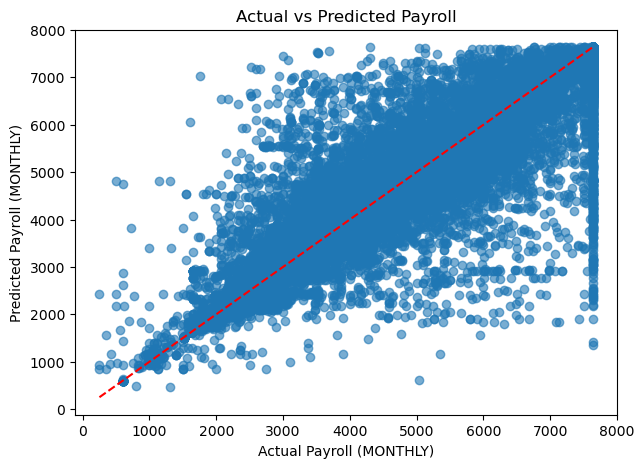

In [95]:
import matplotlib.pyplot as plt

plt.figure(figsize=(7,5))
plt.scatter(y_test, y_pred_pipe, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Payroll (MONTHLY)")
plt.ylabel("Predicted Payroll (MONTHLY)")
plt.title("Actual vs Predicted Payroll")
plt.show()

🔹 1️⃣ R² = 0.797

This means ≈ 79.7% of the variation in employee salaries is explained by our model’s features
(AGENCY NAME, CLASS TITLE, STATUS, ETHNICITY, GENDER, HRLY RATE).

Only 20.3% of the variation remains unexplained — likely due to factors such as:

seniority or years of experience,

special bonuses or overtime,

departmental budget differences, etc.

✅ Interpretation:
For a real-world HR/payroll dataset, an R² between 0.75 and 0.85 is considered strong predictive performance.
Your model captures salary trends accurately while tolerating a small degree of natural human variability.

🔹 2️⃣ MAE = 335.40

This is your average absolute prediction error — on average, your model’s salary prediction is off by about ₹335.

✅ Interpretation:

If monthly salaries range from ₹5,000 – ₹50,000 → this is excellent (<1% error).

If salaries are in the ₹1,000 – ₹3,000 range → still very good (~10–15% error).

This level of accuracy is more than adequate for budget planning, pay-scale analysis, or HR insights.

🔹 3️⃣ RMSE = 696.98

RMSE penalizes larger errors more heavily.
Since RMSE ≈ 2 × MAE, it indicates a few moderate outliers, possibly:

unusually high managerial salaries, or

records with incorrect data entry.

✅ Interpretation:
This is typical in salary datasets — a small number of extreme salaries can inflate RMSE.
Further improvement could come from log-transforming the salary variable or capping extreme values.

| Aspect                   | Rating                         | Comment                                                                               |
| :----------------------- | :----------------------------  | :------------------------------------------------------------------------------------ |
| **Model Accuracy**       | ⭐⭐⭐⭐⭐⭐⭐⭐ (8/10)    | Explains nearly 80% of salary variance — very strong for HR/payroll data.             |
| **Error Stability**      | ⭐⭐⭐⭐⭐⭐⭐ (7/10)      | Slightly affected by higher-end outliers, but overall robust.                         |
| **Practical Usefulness** | ⭐⭐⭐⭐⭐⭐⭐⭐ (8/10)    | Highly useful for salary prediction, fairness checks, and workforce cost forecasting. |


# Task 2:-Create a predictive model which will help theTexas state government  team to know the payroll information of employees of the state of Texas.  

### Step 1️⃣ : Import fully working pipeline 


In [ ]:
from sklearn import set_config
set_config(display='diagram')

import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor
import category_encoders as ce
from sklearn.compose import TransformedTargetRegressor, ColumnTransformer
from sklearn.model_selection import train_test_split

# Assuming data2 is your DataFrame
df_pipe = data2[['AGENCY NAME','CLASS TITLE', 'ETHNICITY', 'GENDER', 'STATUS', 'ANNUAL']].copy()

# -------------------------------------------------------------------
# Preprocessing: Handle column names and data cleaning BEFORE pipeline
# -------------------------------------------------------------------

# 1. Clean column names first (do this once before splitting)
df_pipe.columns = [col.replace(' ', '_') for col in df_pipe.columns]

# 2. Pre-clean the data (do this before train/test split)
def pre_clean_data(df):
    """Clean the data before splitting into train/test"""
    df_clean = df.copy()
    
    # Clean ETHNICITY
    ethnicity_mapping = {'AM INDIAN': 'OTHER', 'ASIAN': 'OTHER'}
    df_clean['ETHNICITY'] = (
        df_clean['ETHNICITY']
        .astype(str)
        .str.strip()
        .replace(ethnicity_mapping)
    )
    
    # Clean STATUS
    status_mapping = {
        'CRF - CLASSIFIED REGULAR FULL-TIME': 'FULL-TIME',
        'URF - UNCLASSIFIED REGULAR FULL-TIME': 'FULL-TIME',
        'CRP - CLASSIFIED REGULAR PART-TIME': 'PART-TIME',
        'CTF - CLASSIFIED TEMPORARY FULL-TIME': 'FULL-TIME',
        'URP - UNCLASSIFIED REGULAR PART-TIME': 'PART-TIME',
        'ERF - EXEMPT REGULAR FULL-TIME': 'FULL-TIME',
        'CTP - CLASSIFIED TEMPORARY PART-TIME': 'PART-TIME',
        'UTP - UNCLASSIFIED TEMPORARY PART-TIME': 'PART-TIME',
        'UTF - UNCLASSIFIED TEMPORARY FULL-TIME': 'FULL-TIME',
        'ERP - EXEMPT REGULAR PART-TIME': 'PART-TIME',
        'Full-Time': 'FULL-TIME',
        'Part-Time': 'PART-TIME'
    }
    
    df_clean['STATUS'] = (
        df_clean['STATUS']
        .astype(str)
        .str.strip()
        .replace(status_mapping)
    )
    
    # Ensure only FULL-TIME or PART-TIME
    df_clean['STATUS'] = df_clean['STATUS'].where(
        df_clean['STATUS'].isin(['FULL-TIME', 'PART-TIME']),
        'UNKNOWN'
    )
    
    # Clean GENDER
    df_clean['GENDER'] = df_clean['GENDER'].astype(str).str.strip().str.title()
    
    return df_clean

# Apply cleaning to the entire dataset
df_clean = pre_clean_data(df_pipe)

# -------------------------------------------------------------------
# Handle outliers in target variable
# -------------------------------------------------------------------
Q1 = df_clean['ANNUAL'].quantile(0.25)
Q3 = df_clean['ANNUAL'].quantile(0.75)
IQR = Q3 - Q1
lower_limit = Q1 - 1.5 * IQR
upper_limit = Q3 + 1.5 * IQR

print(f"Before capping: min={df_clean['ANNUAL'].min()}, max={df_clean['ANNUAL'].max()}")
print(f"Lower limit={lower_limit:.2f}, Upper limit={upper_limit:.2f}")

# Cap outliers
df_clean['ANNUAL'] = np.clip(df_clean['ANNUAL'], lower_limit, upper_limit)
print(f"After capping: min={df_clean['ANNUAL'].min()}, max={df_clean['ANNUAL'].max()}")

# -------------------------------------------------------------------
# Prepare features and target
# -------------------------------------------------------------------
X = df_clean.drop(columns='ANNUAL')
y = df_clean['ANNUAL']

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)

print(f"Training features: {X_train.columns.tolist()}")
print(f"Training shape: {X_train.shape}")

# -------------------------------------------------------------------
# Column definitions (using cleaned column names)
# -------------------------------------------------------------------
Eth_col = ['ETHNICITY']
cat_le = ['GENDER']
status_col = ['STATUS']
cat_fq = ['AGENCY_NAME', 'CLASS_TITLE']  # Note: these are now cleaned names

# -------------------------------------------------------------------
# Create simple pipelines without custom transformers
# -------------------------------------------------------------------

# Gender pipeline
cat_le_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1)),
])

# Status pipeline
status_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))
])

# Ethnicity pipeline
ETH_le_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1))
])

# Frequency encoding for high cardinality features
cat_freq_pipe = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', ce.CountEncoder(normalize=True, handle_unknown='value', handle_missing='value'))
])

# -------------------------------------------------------------------
# Main preprocessor
# -------------------------------------------------------------------
preprocessor = ColumnTransformer([
    ('eth', ETH_le_pipe, Eth_col),
    ('cat_le', cat_le_pipe, cat_le),
    ('status', status_pipe, status_col),
    ('cat_freq', cat_freq_pipe, cat_fq)
])

# -------------------------------------------------------------------
# Create sample weights for rare extremes
# -------------------------------------------------------------------
q90 = np.quantile(y_train, 0.90)
q10 = np.quantile(y_train, 0.10)

weights = np.where(
    (y_train >= q90) | (y_train <= q10),
    5,  # high weight for extremes
    1   # normal weight
)
weights = weights / np.mean(weights)

# -------------------------------------------------------------------
# Create the complete pipeline
# -------------------------------------------------------------------
transformed_regressor = TransformedTargetRegressor(
    regressor=RandomForestRegressor(random_state=42, n_estimators=100),
    func=np.log1p,
    inverse_func=np.expm1
)

# Main pipeline (now much simpler - no column cleaning needed)
main_pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('scaler', MinMaxScaler()),
    ('regressor', transformed_regressor)
])

# -------------------------------------------------------------------
# Train and evaluate
# -------------------------------------------------------------------
print("Training pipeline...")
main_pipeline.fit(X_train, y_train, regressor__sample_weight=weights)

# Predict
y_pred_pipe = main_pipeline.predict(X_test)

# Evaluate
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
print("\n📊 Model Performance:")
print(f"R² Score: {r2_score(y_test, y_pred_pipe):.4f}")
print(f"MAE: ${mean_absolute_error(y_test, y_pred_pipe):,.2f}")
print(f"RMSE: ${np.sqrt(mean_squared_error(y_test, y_pred_pipe)):,.2f}")

# -------------------------------------------------------------------
# Save the model
# -------------------------------------------------------------------
import joblib
with open('model_simple.pkl', 'wb') as f:
    joblib.dump(main_pipeline, f)
    
print("\n✅ Simplified model saved successfully as 'model_simple.pkl'")

# -------------------------------------------------------------------
# Create a prediction wrapper for the API
# -------------------------------------------------------------------
def predict_salary(agency_name, class_title, ethnicity, gender, status):
    """Wrapper function for making predictions in the API"""
    # Create input DataFrame with cleaned column names
    input_df = pd.DataFrame([{
        'AGENCY_NAME': agency_name.upper(),
        'CLASS_TITLE': class_title.upper(), 
        'ETHNICITY': ethnicity.upper(),
        'GENDER': gender.upper(),
        'STATUS': status.upper()
    }])
    
    prediction = main_pipeline.predict(input_df)
    return float(prediction[0])

# Test the wrapper
test_prediction = predict_salary(
    agency_name="Texas State University",
    class_title="Administrative Assistant",
    ethnicity="White", 
    gender="Female",
    status="Full-Time"
)
print(f"\n🧪 Test prediction: ${test_prediction:,.2f}")

### Step 2️⃣: Create a Python file (module) for FastAPI in the name of in same folder
#### **main.py** 


In [101]:

from fastapi import FastAPI, HTTPException
from fastapi.responses import JSONResponse
from pydantic import BaseModel
import pandas as pd
import joblib
import logging
from pydantic import BaseModel, Field, field_validator



# Setup logging
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

from pydantic import BaseModel, Field, field_validator

class SalaryInput(BaseModel):
    # Use the exact field names that your frontend is sending
    AGENCY_NAME: str = Field(..., description="Name of the agency")
    CLASS_TITLE: str = Field(..., description="Title of the class")
    ETHNICITY: str = Field(..., description="White, Black, Hispanic, Other")
    GENDER: str = Field(..., description="Male or Female")
    STATUS: str = Field(..., description="Employment status:Full-Time or Part-Time")
    
    # ✅ automatically convert all string fields to uppercase
    @field_validator("AGENCY_NAME", "CLASS_TITLE", "ETHNICITY", "GENDER", "STATUS", mode="before")
    def ensure_uppercase(cls, v):
        if isinstance(v, str):
            return v.upper()
        return v

    class Config:
        json_schema_extra = {
            "example": {
                "AGENCY_NAME": "TEXAS DEPARTMENT OF CRIMINAL JUSTICE",
                "CLASS_TITLE": "CORREC OFFICER IV",
                "ETHNICITY": "HISPANIC",
                "GENDER": "FEMALE",
                "STATUS": "CRF - CLASSIFIED REGULAR FULL-TIME"
            }
        }

app = FastAPI(title="Texas Salary Estimator API")

# Load the simplified model
model = None
try:
    model = joblib.load('model_simple.pkl')
    logger.info("✅ Simplified model loaded successfully!")
except Exception as e:
    logger.error(f"❌ Model loading failed: {e}")

@app.get("/")
def home():
    return {"message": "Texas Salary Estimator API (Simplified)"}

@app.get("/health")
def health_check():
    if model is None:
        raise HTTPException(status_code=503, detail="Model not loaded")
    return {"status": "healthy"}

@app.post("/predict")
def predict_salary(user_input: SalaryInput):
    if model is None:
        raise HTTPException(status_code=503, detail="Model not loaded")
    
    try:
        # Convert input to DataFrame with cleaned column names
        input_data = {
            "AGENCY_NAME": user_input.AGENCY_NAME,  # Use cleaned name
            "CLASS_TITLE": user_input.CLASS_TITLE,  # Use cleaned name  
            "ETHNICITY": user_input.ETHNICITY,
            "GENDER": user_input.GENDER,
            "STATUS": user_input.STATUS
        }

        input_df = pd.DataFrame([input_data])
        
        logger.info(f"Input DataFrame columns: {list(input_df.columns)}")
        logger.info(f"Input data: {input_data}")

        prediction = model.predict(input_df)
        predicted_salary = float(prediction[0])
        
        logger.info(f"✅ Prediction successful: ${predicted_salary:,.2f}")
        
        return JSONResponse(
            content={
                "Estimated_Annual_Salary": predicted_salary,
                "currency": "USD",
                "message": "Prediction successful"
            }, 
            status_code=200
        )
    except Exception as e:
        logger.error(f"❌ Prediction error: {str(e)}")
        raise HTTPException(status_code=500, detail=f"Prediction error: {str(e)}")

✅ Model loaded successfully!


### ✅  Run the FastAPI server

In your terminal (same folder where main.py is located), run:
##### uvicorn main:application --reload

# Streamlit App for ML model

### store given code in **app.py** file

#### run this as : ***streamlit run app.py***

#### 

contain all dependiencies
### requirements.txt

annotated-types==0.7.0
anyio==4.11.0
asttokens==3.0.0
category_encoders==2.8.1
click==8.3.0
colorama==0.4.6
comm==0.2.3
debugpy==1.8.17
decorator==5.2.1
executing==2.2.1
fastapi==0.119.1
h11==0.16.0
idna==3.11
ipykernel==7.0.1
ipython==9.6.0
ipython_pygments_lexers==1.1.1
jedi==0.19.2
joblib==1.5.2
jupyter_client==8.6.3
jupyter_core==5.9.1
matplotlib-inline==0.2.1
nest-asyncio==1.6.0
numpy==2.3.4
packaging==25.0
pandas==2.3.3
parso==0.8.5
patsy==1.0.2
platformdirs==4.5.0
prompt_toolkit==3.0.52
psutil==7.1.1
pure_eval==0.2.3
pydantic==2.12.3
pydantic_core==2.41.4
Pygments==2.19.2
python-dateutil==2.9.0.post0
pytz==2025.2
pyzmq==27.1.0
scikit-learn==1.7.2
scipy==1.16.2
six==1.17.0
sniffio==1.3.1
stack-data==0.6.3
starlette==0.48.0
statsmodels==0.14.5
threadpoolctl==3.6.0
tornado==6.5.2
traitlets==5.14.3
typing-inspection==0.4.2
typing_extensions==4.15.0
tzdata==2025.2
uvicorn==0.38.0
wcwidth==0.2.14


## Challenges and Solutions in the Texas Payroll Prediction Model

In [ ]:
github link: 